# Analyzing Yelp Reviews in Time Series

Previous studies analyzed the textual features of Yelp reviews.

We plan to look at the reviews in time series - also, we plan to investigate the user, location, and photo data associated with reviews/businesses. 

The enhancements/contributions of this study includes:
    1. Review - time
    2. Reviewer - social network, expertise
    3. Location - safety, ...
    4. Photos - counts, contents

## Import Required Packages

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import word_tokenize
from sklearn.cluster import KMeans
import textblob as tb

## Reading Data

In [2]:
review_df = pd.read_csv('./data/yelp_review.csv')
business_df = pd.read_csv('./data/yelp_business.csv')

## Adding Names of Businesses to Reviews

In the previous version we were playing with business_id to find unique business, now we are playing with business name to find businesses across different geographic locations. 

We are playing with Starbucks here.

In [3]:
business_df.columns

Index(['business_id', 'name', 'neighborhood', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'stars', 'review_count',
       'is_open', 'categories'],
      dtype='object')

In [9]:
business_df.city.nunique()

1093

In [8]:
business_df.city.unique()

array(['Ahwatukee', 'McMurray', 'Phoenix', ..., 'Henderson (Green Valley)',
       'Side Slopes', 'Saint-Basile-Le-Grand'], dtype=object)

In [10]:
business_df.neighborhood.nunique()

408

In [11]:
name_df = business_df[['business_id', 'name']]
name_df.head()

,business_id,name
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design"""
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon"""
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle"""
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority"""
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap"""


In [13]:
named_review_df = pd.merge(review_df, name_df, how = 'left', left_on = 'business_id', right_on = 'business_id')
named_review_df.head()

,review_id,user_id,business_id,stars,date,text,useful,funny,cool,name
0,vkVSCC7xljjrAI4UGfnKEQ,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,5,2016-05-28,Super simple place but amazing nonetheless. It...,0,0,0,"""Wilensky's"""
1,n6QzIUObkYshz4dz2QRJTw,bv2nCi5Qv5vroFiqKGopiw,VR6GpWIda3SfvPC-lg9H3w,5,2016-05-28,Small unassuming place that changes their menu...,0,0,0,"""Tuck Shop"""
2,MV3CcKScW05u5LVfF6ok0g,bv2nCi5Qv5vroFiqKGopiw,CKC0-MOWMqoeWf6s-szl8g,5,2016-05-28,Lester's is located in a beautiful neighborhoo...,0,0,0,"""Lester's Deli"""
3,IXvOzsEMYtiJI0CARmj77Q,bv2nCi5Qv5vroFiqKGopiw,ACFtxLv8pGrrxMm6EgjreA,4,2016-05-28,Love coming here. Yes the place always needs t...,0,0,0,"""Five Guys"""
4,L_9BTb55X0GDtThi6GlZ6w,bv2nCi5Qv5vroFiqKGopiw,s2I_Ni76bjJNK9yG60iD-Q,4,2016-05-28,Had their chocolate almond croissant and it wa...,0,0,0,"""Maison Christian Faure"""


In [14]:
named_review_df['date'] = pd.to_datetime(named_review_df['date'])

In [15]:
named_review_df.set_index(['name', 'date'], inplace=True)
named_review_df.sort_index(inplace=True)
named_review_df.head()

review_id                 user_id  \
name               date                                                         
""T"s Hair Affair" 2016-09-03  ZLFPoH5cfs5g-DOCPCzYIQ  DsQj4W1UKchSYRBgS2DOJw   
                   2016-12-19  p9sz5zUpGe7EjbkY1qS79A  JLGXncZMpYyXgt2v6QGlFA   
                   2017-04-03  R5rm8k8vI_H4-c01uigeAA  HiuLnUWrDkYUCLL-VZOaTw   
                   2017-04-03  _BoCfyzzFqzZHB_3qNAsZA  13Ymb4LBMgRtlO5a-0bxug   
                   2017-04-05  CH8piJ1af3hO0DKZU1eqxw  5UXbpbctmGQ7m0PBLwBKCg   

                                          business_id  stars  \
name               date                                        
""T"s Hair Affair" 2016-09-03  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2016-12-19  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-03  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-03  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-05  aIq4Qxwr14JeQWYqbc5-5g      5   

                                                                            text  \
name               date                                                            
""T"s Hair Affair" 2016-09-03  I've been taking my son to Tanya for a couple ...   
                   2016-12-19  I have seen Tanya for years now and she has al...   
                   2017-04-03  If you need a haircut just call and make an ap...   
                   2017-04-03  I have been going to Tanya for years now. She ...   
                   2017-04-05  Had my regular appointment back on March 23 an...   

                               useful  funny  cool  
name               date                             
""T"s Hair Affair" 2016-09-03       1      0     0  
                   2016-12-19       2      0     0  
                   2017-04-03       0      0     0  
                   2017-04-03       1      0     0  
                   2017-04-05       0      0     0

In [16]:
sorted_review_df = named_review_df.sort_index(axis=0, level=['name', 'date'])
sorted_review_df.head(10)

review_id                 user_id  \
name               date                                                         
""T"s Hair Affair" 2016-09-03  ZLFPoH5cfs5g-DOCPCzYIQ  DsQj4W1UKchSYRBgS2DOJw   
                   2016-12-19  p9sz5zUpGe7EjbkY1qS79A  JLGXncZMpYyXgt2v6QGlFA   
                   2017-04-03  R5rm8k8vI_H4-c01uigeAA  HiuLnUWrDkYUCLL-VZOaTw   
                   2017-04-03  _BoCfyzzFqzZHB_3qNAsZA  13Ymb4LBMgRtlO5a-0bxug   
                   2017-04-05  CH8piJ1af3hO0DKZU1eqxw  5UXbpbctmGQ7m0PBLwBKCg   
                   2017-04-07  8Grq9GjAN8rYhWnoB-0fzQ  6Uc9nw5bvGLv2WLXFgMlBw   
                   2017-04-26  u_-C08DDnUVLKSWE3-4XHQ  Y6Sv2rvSx1bOW2wtBsUsMg   
                   2017-05-12  L68Pn2LeQEgdmdZTqmTxCg  eOzu1f0GCcyEyjkjltNRNA   
                   2017-06-05  atGLEhp1KrDQio4JuXfQ-Q  3FkCyZiLFdbMNYE_b6vfeQ   
                   2017-09-07  nBtopiRC32ITx4riGR76UA  TTTiDeMwsclVwMdhPedFCg   

                                          business_id  stars  \
name               date                                        
""T"s Hair Affair" 2016-09-03  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2016-12-19  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-03  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-03  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-05  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-07  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-04-26  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-05-12  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-06-05  aIq4Qxwr14JeQWYqbc5-5g      5   
                   2017-09-07  aIq4Qxwr14JeQWYqbc5-5g      5   

                                                                            text  \
name               date                                                            
""T"s Hair Affair" 2016-09-03  I've been taking my son to Tanya for a couple ...   
                   2016-12-19  I have seen Tanya for years now and she has al...   
                   2017-04-03  If you need a haircut just call and make an ap...   
                   2017-04-03  I have been going to Tanya for years now. She ...   
                   2017-04-05  Had my regular appointment back on March 23 an...   
                   2017-04-07  Tanya is a great listener and knows how to giv...   
                   2017-04-26  Been going to Tanya the past year and a half. ...   
                   2017-05-12  I been seeing Tanya for 3 years now and couldn...   
                   2017-06-05  Tanya is always professional, does a great job...   
                   2017-09-07  Love the cut from Tanya!! Very professional an...   

                               useful  funny  cool  
name               date                             
""T"s Hair Affair" 2016-09-03       1      0     0  
                   2016-12-19       2      0     0  
                   2017-04-03       0      0     0  
                   2017-04-03       1      0     0  
                   2017-04-05       0      0     0  
                   2017-04-07       1      0     0  
                   2017-04-26       0      0     0  
                   2017-05-12       0      0     0  
                   2017-06-05       0      0     0  
                   2017-09-07       0      0     0

In [17]:
# Count # of reviews for each business
review_counts = named_review_df.reset_index().groupby(['name'])['text'].nunique()
type(review_counts)

pandas.core.series.Series

In [18]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20, 8)

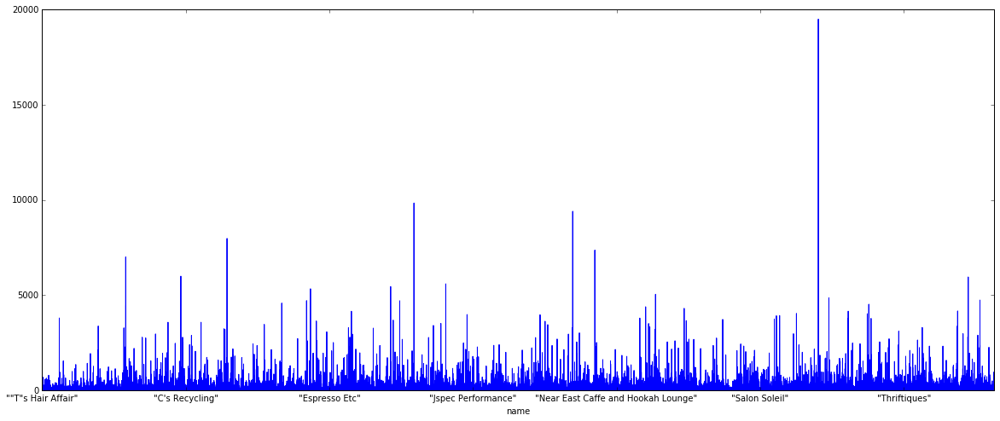

In [19]:
#reviews = review_counts.cumsum()
review_counts.plot()

In [20]:
review_counts[review_counts > 1000].shape

(500,)

There are 500 businesses have more than 1000 reviews in the time frame.

In [21]:
review_counts[review_counts > 500].shape

(1394,)

There are 1394 businesses have more than 500 reviews in the time frame.

In [22]:
review_counts.idxmax()

'"Starbucks"'

In [23]:
review_counts.max()

19504

In [24]:
review_counts['"Starbucks"']

19504

In [25]:
sorted_review_df.ix['"Starbucks"']

,review_id,user_id,business_id,stars,text,useful,funny,cool
date,,,,,,,,
2005-11-30,7EP7oqmbnpgd6l9GDKpCng,VnlUnPrfae-fbqDoXuvDbw,CZ1NjI_Kyg_V3ol3se2fQg,4,"This is in the center of Public Square, so I a...",0,0,0
2006-01-06,xiWylut5_kAE62Q_gFZJNQ,JlD8asiXfY1CoGy3VHFRlA,gYaHaYOv9xdLbIDWCpTjFA,4,This cozy little starbucks looks like it shoul...,0,1,0
2006-01-14,WkSQetBc7UJAb3tUntCihg,_8ch-8X97NRtLwdtSd-XrQ,CZ1NjI_Kyg_V3ol3se2fQg,3,This Starbucks is fine. Convenient location. ...,0,0,0
2006-01-18,RgFl_1qEMY4Gw3q3ewV4aw,JlD8asiXfY1CoGy3VHFRlA,UEpKf4g8oaAIr0ZIM0TXgw,2,"This starbucks is a small, cozy little place. ...",0,0,0
2006-04-04,2XngYSP5gHHoSCHJSqZuxg,sT5zogztfenLWofoZ92Eyg,OkTLoA-Gims91odbtVGegA,3,"Zu klein, immer viel zu voll, zu teuer - aber ...",0,0,0
2006-04-08,RpBHRcoS6e8CyxB5ssHFnQ,qnZhMDNseLe2v4ASZdaMMw,OkTLoA-Gims91odbtVGegA,3,Kann mich nur anschließen. Wer im Starbucks ei...,0,0,0
2006-04-08,obQf2geMebzqmeq0tcm20w,ZIo4FdMEsHs9SAeS30g0BQ,OkTLoA-Gims91odbtVGegA,2,Für mich ist Kaffee ohne rauchen nix. Allerdin...,0,0,0
2006-04-14,phCc-Md2KM4wpdK49b_xiA,rJe3PBY2kHJ0Fl4u91cNSQ,OkTLoA-Gims91odbtVGegA,3,"Viel zu lange Schlange, teure Kaffees (aber au...",0,0,0
2006-04-16,60tsF6E_X3DS4qNhvIdLsA,Gt5pfHWMOq3UiBVDLyczLA,OkTLoA-Gims91odbtVGegA,2,Meine Vorfreude auf einen leckeren Kaffee war ...,0,0,0


In [26]:
SB_df = sorted_review_df.ix['"Starbucks"']

In [27]:
SB_df.head()

,review_id,user_id,business_id,stars,text,useful,funny,cool
date,,,,,,,,
2005-11-30,7EP7oqmbnpgd6l9GDKpCng,VnlUnPrfae-fbqDoXuvDbw,CZ1NjI_Kyg_V3ol3se2fQg,4,"This is in the center of Public Square, so I a...",0,0,0
2006-01-06,xiWylut5_kAE62Q_gFZJNQ,JlD8asiXfY1CoGy3VHFRlA,gYaHaYOv9xdLbIDWCpTjFA,4,This cozy little starbucks looks like it shoul...,0,1,0
2006-01-14,WkSQetBc7UJAb3tUntCihg,_8ch-8X97NRtLwdtSd-XrQ,CZ1NjI_Kyg_V3ol3se2fQg,3,This Starbucks is fine. Convenient location. ...,0,0,0
2006-01-18,RgFl_1qEMY4Gw3q3ewV4aw,JlD8asiXfY1CoGy3VHFRlA,UEpKf4g8oaAIr0ZIM0TXgw,2,"This starbucks is a small, cozy little place. ...",0,0,0
2006-04-04,2XngYSP5gHHoSCHJSqZuxg,sT5zogztfenLWofoZ92Eyg,OkTLoA-Gims91odbtVGegA,3,"Zu klein, immer viel zu voll, zu teuer - aber ...",0,0,0


In [28]:
SB_df.groupby('business_id').review_id.nunique()

business_id
-9Ir5OiFiOszIgeFgalXcw     37
-BJ0Z28LoETB_ZsdA4Ikeg      4
-Mu6qCYjrcvBgwIhLoh08g      4
-P4Mmh-0pkC4yb6cyPJhbA     15
-RxkfrFaOLpE6Be3zGfsVg      5
-TGwtTiieh_JLml5_VRMQA      6
-aoMfFDMmJOgkOT3dacwpg     12
-i3dOjumvOw-52aGXU1xDg     41
-ifVnqwrgCE3Nc4svkJDMg     44
-qfnxs7S1hUcjhKQMv5UQg     21
-yD0mm71HtZZDE9meI9FqA      7
00liP5s4IKsq97EH4Cc0Tw     46
02eRjV8jRzHmsXiTUXNVJw      9
08dHPmiLmCOn0ikddLGv6A     28
0AJF-USLN6K5T4caooDdjw     56
0HIiowOQJgs46UL8Vt3lsQ      9
0PJQ-WR-S286xH6m2RWeQw     21
0RNne3uYCtzIBubQpSuvrw      5
0_Twd4emsDeKa91azXGoug      6
0a9uFl_rB7vAN__D4KPnNQ     14
0kOFaly9TuwsAQzHrURI4Q     21
0oMs2QdhuLW3wYIJIi0wcw     79
0rg8sJGPWebnxNFExpNdHA      3
0u4A5rNkLToKc5IuhzPzXw      8
0wr58lAX4e_UX0CZfeEoKA    100
1-Z6tVozu4v1JHzlg8x4kA      5
153QMny_1adtMtsf6MP95A     10
1N-OkNrd41rNWEe9DQvHzQ      4
1SoRfuanThvBDYZEQSsePg     15
1Tj0HSSnPgHOj1alfcoXlQ     18
                         ... 
yGAjZwgVINJ9sgEOlgn7zQ      4
yHx_F5tpor6_26tkp5T4UA      

In [29]:
SB_df.index.dtype

dtype('<M8[ns]')

In [30]:
SB_ts = SB_df.reset_index().groupby(SB_df.index.week)['review_id'].nunique()

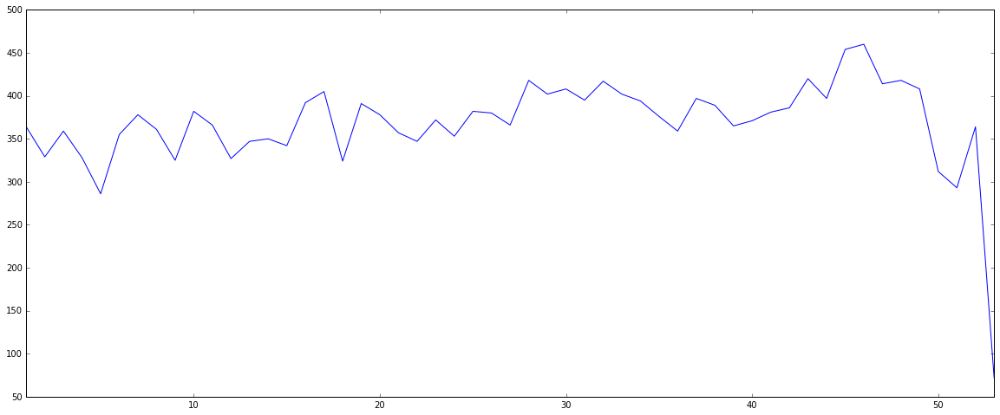

In [31]:
SB_ts.plot()

Most of the months have more than 300 reviews. 

So we may treat each month as a corpus in the time series.

In [32]:
# Construct weekly corpus
SB_reviews = SB_df['text']
#MAG_reviews

In [33]:
print(SB_reviews.resample('M').sum()[0])

This is in the center of Public Square, so I always stop here for a nice warm mocha or Chai Tea! Out of all coffee shops Starcbucks is always my favorite!


In [34]:
# print(MAG_reviews.resample('M').agg({'text' : ' + '.join}))

In [35]:
SB_reviews_monthly = SB_reviews.resample('M').sum()
SB_reviews_monthly.dropna(inplace=True)
#MAG_reviews_weekly['text'].str.split(' ')
SB_reviews_monthly.head()

date
2005-11-30    This is in the center of Public Square, so I a...
2005-12-31                                                    0
2006-01-31    This cozy little starbucks looks like it shoul...
2006-02-28                                                    0
2006-03-31                                                    0
Freq: M, Name: text, dtype: object

In [36]:
SB_monthly = SB_reviews_monthly.str.split('  ')

In [37]:
len(SB_monthly.ix['2005-11-30'])

1

In [39]:
len(SB_monthly.ix['2009-12-31'])

61

In [40]:
SB_monthly[0]

['This is in the center of Public Square, so I always stop here for a nice warm mocha or Chai Tea! Out of all coffee shops Starcbucks is always my favorite!']

In [41]:
for row in SB_monthly.loc[SB_monthly.isnull()].index:
    SB_monthly.at[row] = []

In [42]:
SB_monthly

date
2005-11-30    [This is in the center of Public Square, so I ...
2005-12-31                                                   []
2006-01-31    [This cozy little starbucks looks like it shou...
2006-02-28                                                   []
2006-03-31                                                   []
2006-04-30    [Zu klein, immer viel zu voll, zu teuer - aber...
2006-05-31    [This Starbucks is on the second level of the ...
2006-06-30                                                   []
2006-07-31                                                   []
2006-08-31    [Achtung Starbuck-Fans!\n\n\n In Kürze eröffne...
2006-09-30                                                   []
2006-10-31    [Why it is good:\n-Drive Thru\n\nThe Bad:\n-Lo...
2006-11-30    [I HATE THIS PLACE EVEN MORE!\n\nI get there 9...
2006-12-31    [Whenever I am in Vegas, this is typically the...
2007-01-31    [Look, it's a Starbucks. If you expect it to b...
2007-02-28    [The map makes it dif

In [43]:
SB_monthly.apply(len)

date
2005-11-30      1
2005-12-31      0
2006-01-31      7
2006-02-28      0
2006-03-31      0
2006-04-30      1
2006-05-31      2
2006-06-30      0
2006-07-31      0
2006-08-31      1
2006-09-30      0
2006-10-31      1
2006-11-30      2
2006-12-31      7
2007-01-31      9
2007-02-28      5
2007-03-31     11
2007-04-30      7
2007-05-31      6
2007-06-30      7
2007-07-31      1
2007-08-31     16
2007-09-30      5
2007-10-31      9
2007-11-30      1
2007-12-31      1
2008-01-31      2
2008-02-29      4
2008-03-31      7
2008-04-30     13
             ... 
2015-07-31    273
2015-08-31    272
2015-09-30    252
2015-10-31    225
2015-11-30    226
2015-12-31    216
2016-01-31    279
2016-02-29    343
2016-03-31    202
2016-04-30    331
2016-05-31    288
2016-06-30    341
2016-07-31    237
2016-08-31    278
2016-09-30    256
2016-10-31    276
2016-11-30    213
2016-12-31    264
2017-01-31    257
2017-02-28    220
2017-03-31    263
2017-04-30    268
2017-05-31    285
2017-06-30    230
2017-

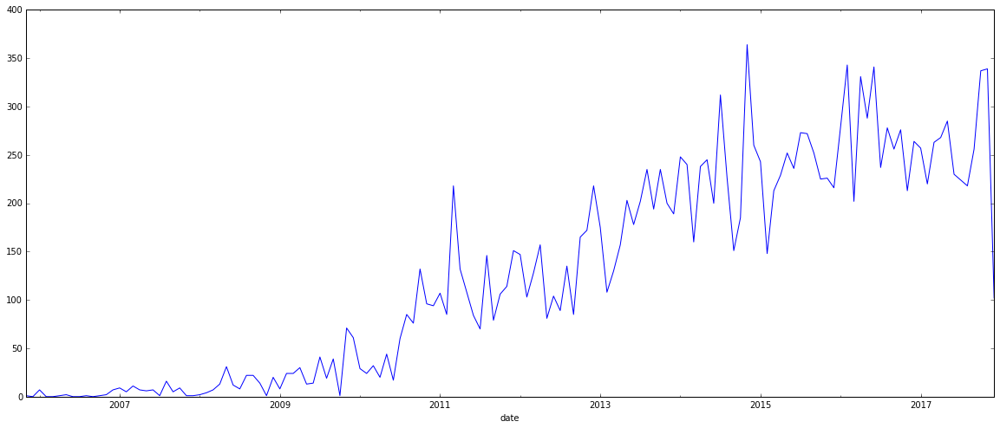

In [44]:
SB_monthly.apply(len).plot()

Number of reviews monthly.

In [45]:
text = SB_monthly.ix['2014-06-30']
length = 0
for t in text:
    length += len(t)

print(length/len(text))
print(length)

506.555
101311


In [46]:
def rev_len(x):
    length = 0
    for t in x:
        length += len(t)
    if(len(x)==0):
        return(0)
    else:
        return(length/len(x))

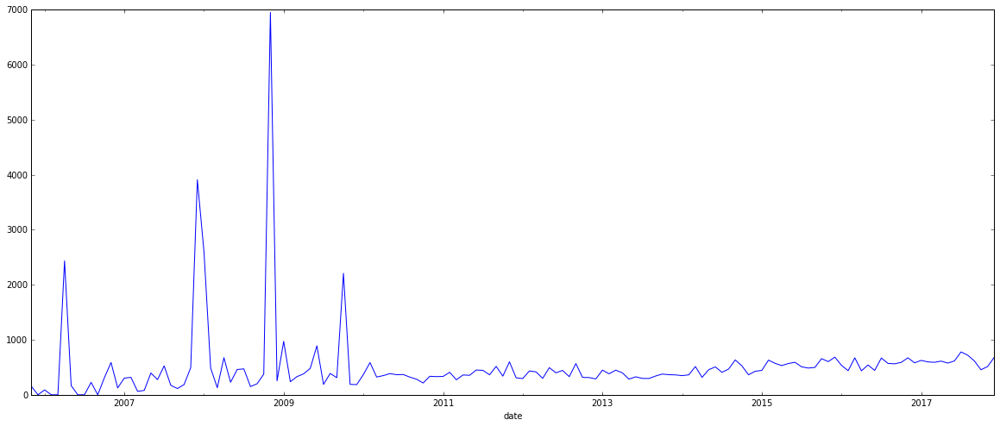

In [47]:
SB_monthly.apply(rev_len).plot()

Average length of reviews monthly.

In [48]:
#MAG_weekly

In [49]:
SB_monthly.apply(len).idxmax()

Timestamp('2014-11-30 00:00:00', offset='M')

In [50]:
SB_monthly.apply(len).max()

364

Clearly Nov 2014 has most reviews (364).

In [51]:
from wordcloud import WordCloud, STOPWORDS # this module is for making wordcloud in python

In [52]:
# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)

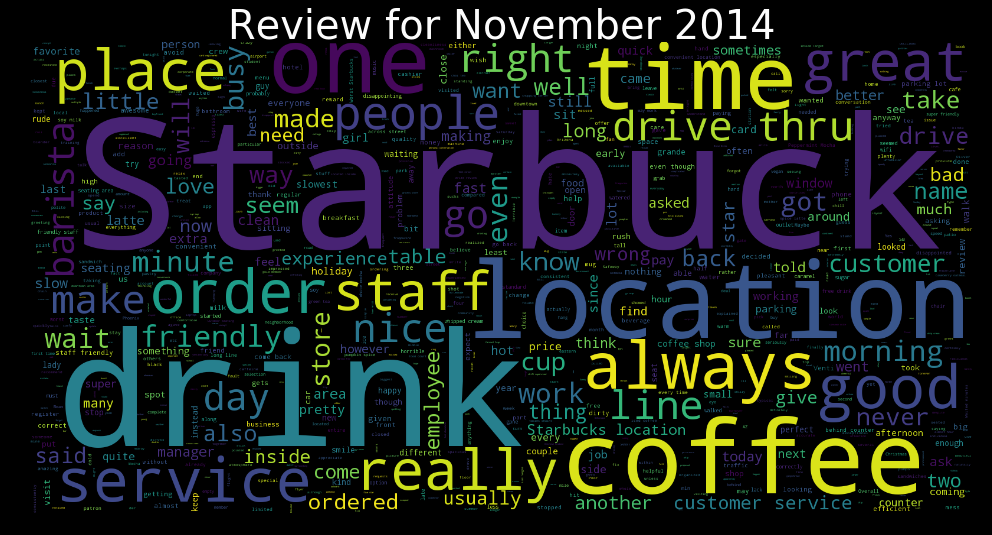

In [53]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(' '.join(SB_monthly.ix['2014-11-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for November 2014", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

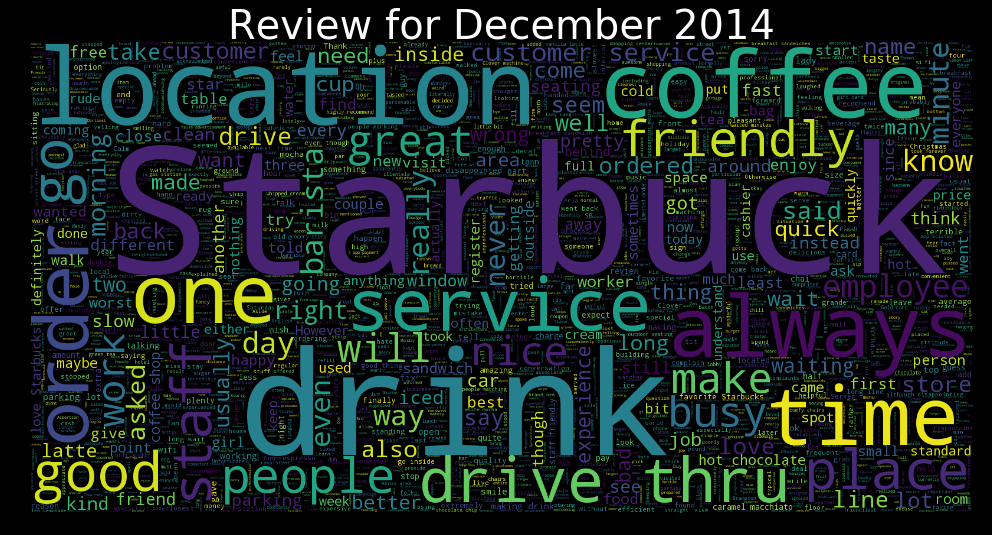

In [54]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc1 = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc1.generate(' '.join(SB_monthly.ix['2014-12-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for December 2014", fontsize=40,color='white')
plt.imshow(wc1, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

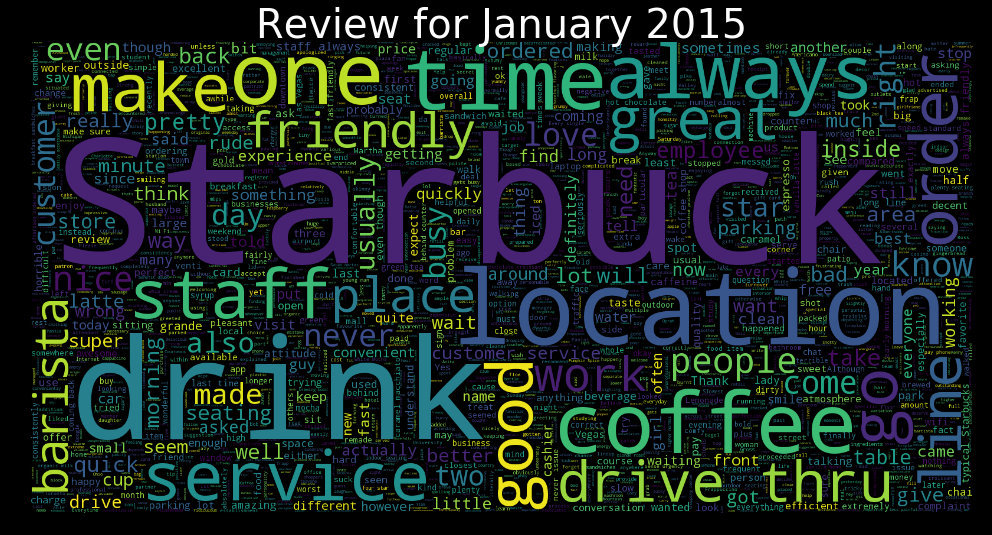

In [55]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc2 = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc2.generate(' '.join(SB_monthly.ix['2015-01-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for January 2015", fontsize=40,color='white')
plt.imshow(wc2, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

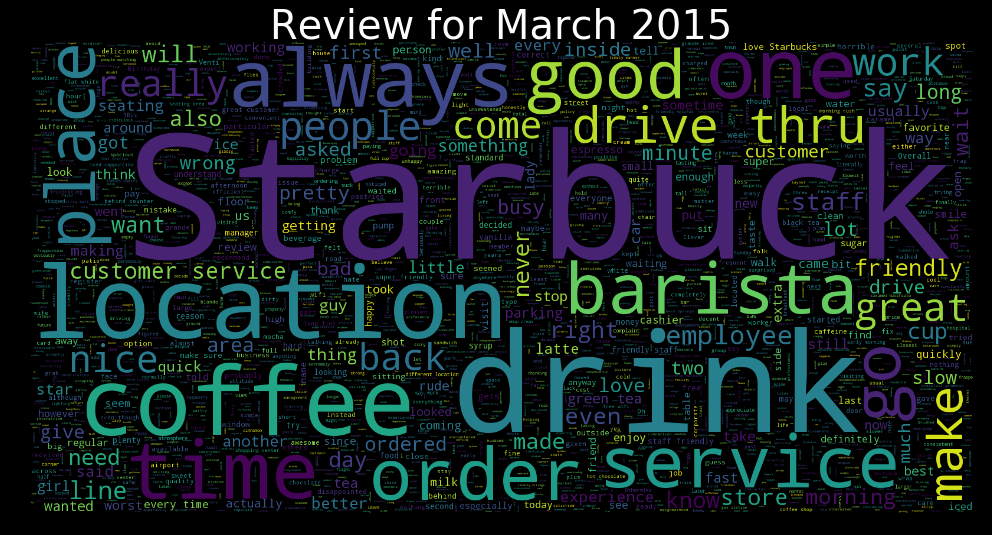

In [56]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc3 = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc3.generate(' '.join(SB_monthly.ix['20135-03-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for March 2015", fontsize=40,color='white')
plt.imshow(wc3, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

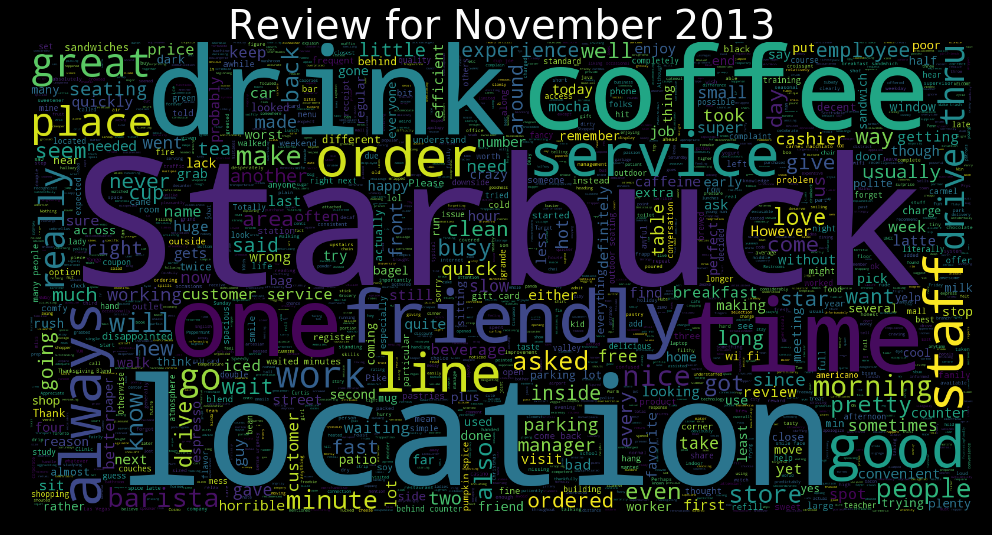

In [58]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2013-11-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for November 2013", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

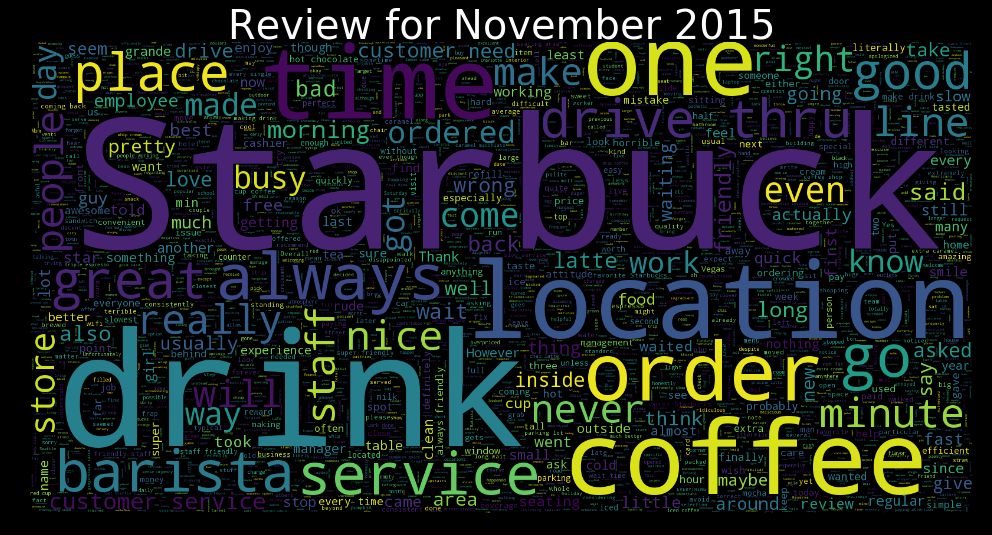

In [59]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2015-11-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for November 2015", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

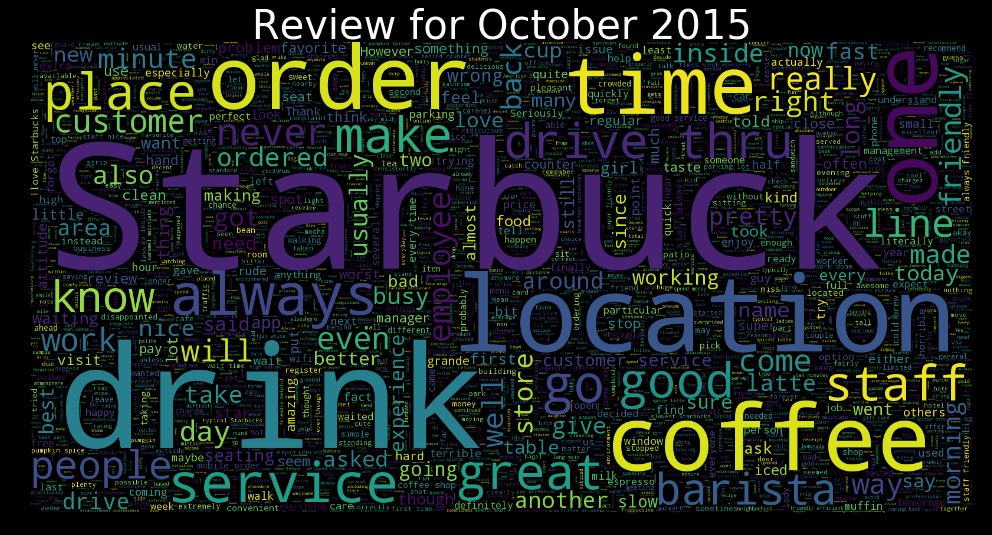

In [60]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2015-10-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for October 2015", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

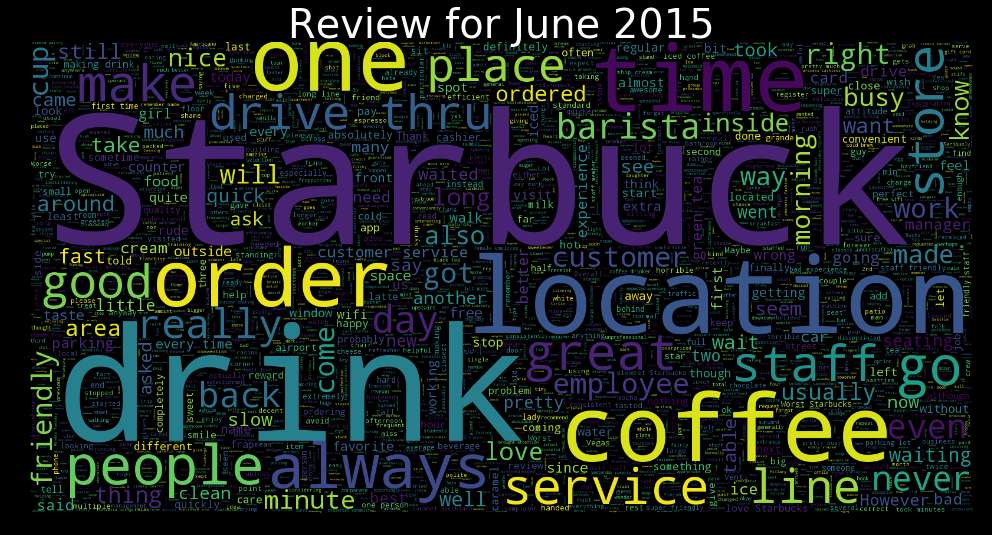

In [61]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2015-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2015", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

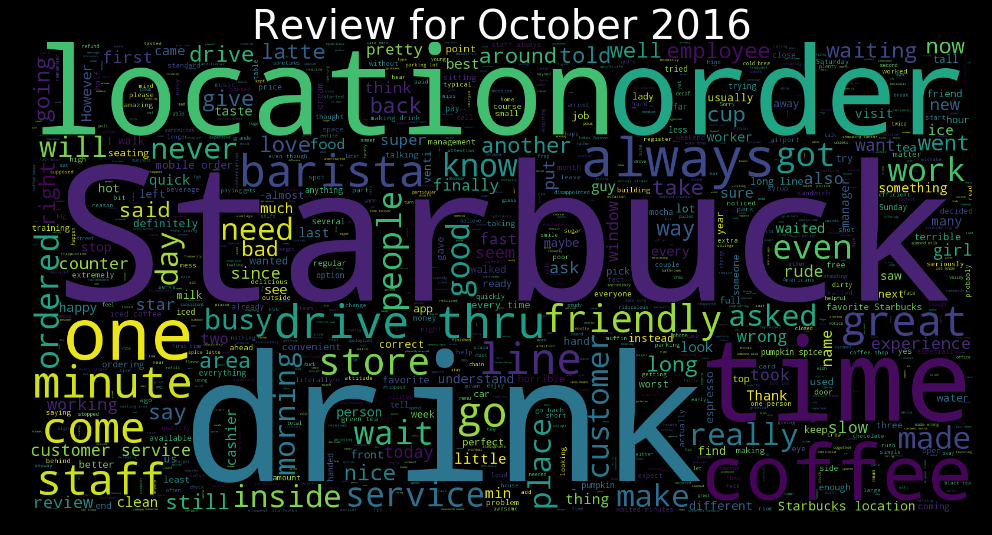

In [62]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2016-10-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for October 2016", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

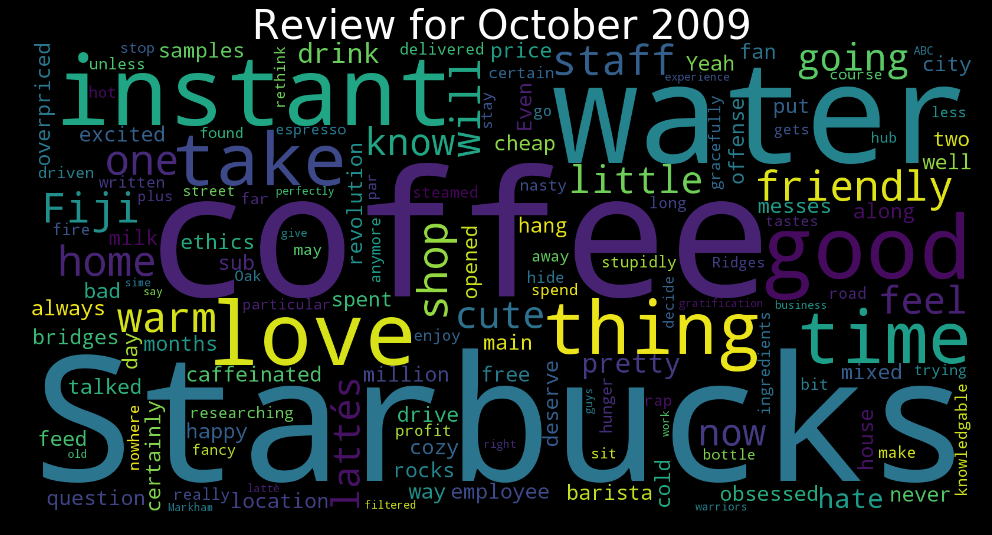

In [63]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2009-10-31']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for October 2009", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

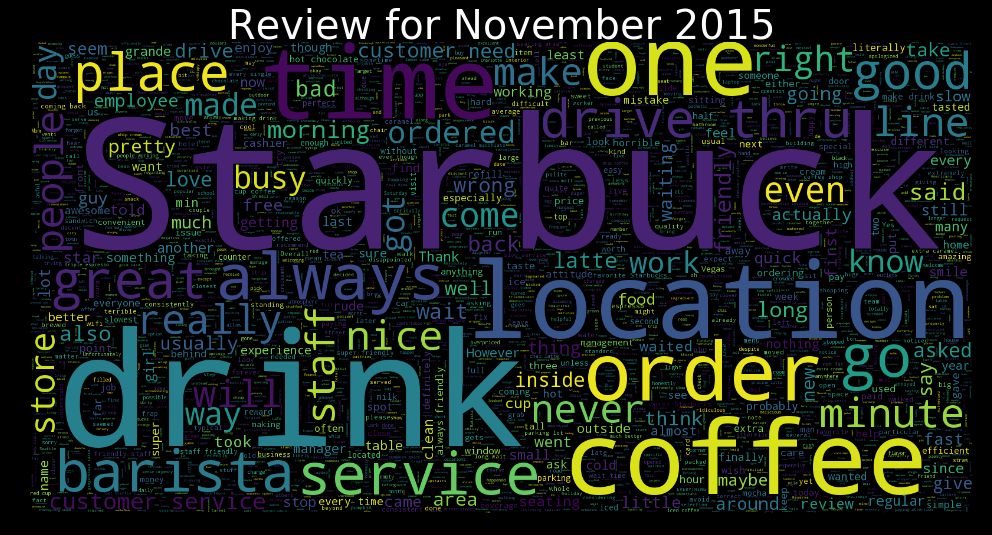

In [65]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2015-11-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for November 2015", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

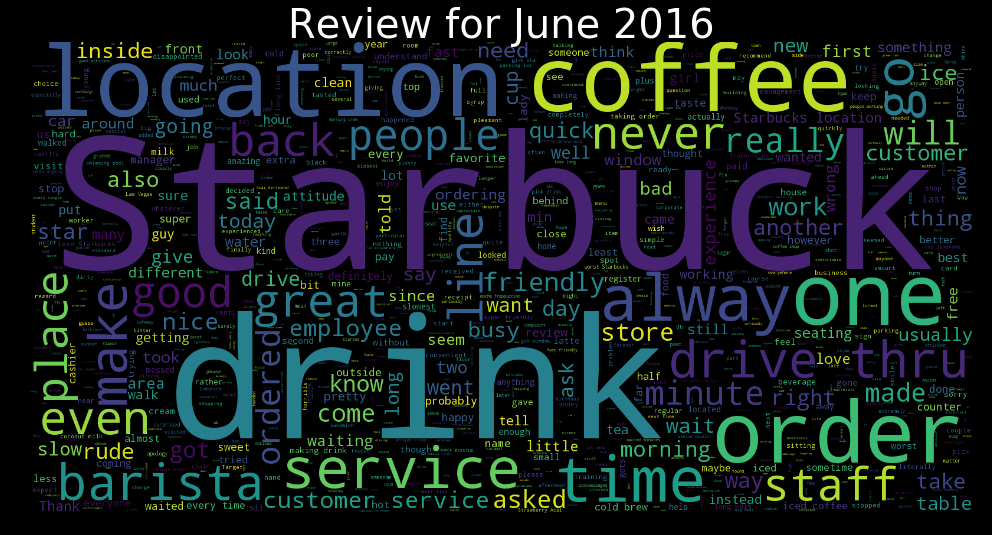

In [66]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2016-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2016", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

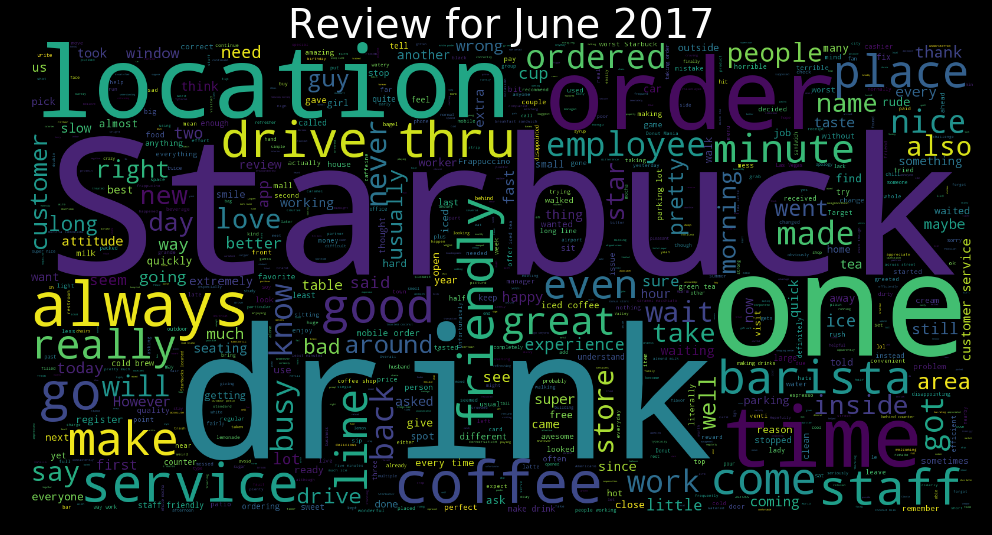

In [67]:
# generate word cloud using df_yelp_tip_top['text_clear']
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
wc.generate(' '.join(SB_monthly.ix['2017-06-30']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title("Review for June 2017", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

From above word cloud comparison you can see that most of the terms are similar, but their frequencies/occurrences (in sizes) are fairly different.

Now let us see if the LDA would some different results.

In [68]:
import re
from nltk import sent_tokenize, word_tokenize, pos_tag
from nltk import RegexpTokenizer #, PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords

In [69]:
stop = [x.strip().lower() for x in stopwords.words('english')]
stemmer = SnowballStemmer("english")
tokenizer = RegexpTokenizer(r'\w+')

In [70]:
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    #stop_free = [w.lower() for w in tokenizer.tokenize(doc) if w.lower() not in stop]
    punc_free = tokenizer.tokenize(stop_free)
    tags = pos_tag(punc_free)
    #filtered = [[t[0] for t in tags if t[1] == tag] for tag in ["NN", "NNS", "NNP", "NNPS", "VB", "VBD", "VBN", "VBP", "VBZ", "VBG"]]
    filtered = [[t[0] for t in tags if t[1] == tag] for tag in ["NN", "NNS", "VB", "VBD", "VBN", "VBP", "VBZ", "VBG"]]
    #filtered = [[t[0] for t in tags if t[1] == tag] for tag in ["NN", "NNS", "NNP", "NNPS"]]
    filtered_flat = [item for sublist in filtered for item in sublist]
    num_free = [x for x in filtered_flat if not (x.isdigit() or x[0] == '-' and x[1:].isdigit())]
    ##num_free = [x for x in stop_free if not (x.isdigit() or x[0] == '-' and x[1:].isdigit())]
    legit_words = [x for x in num_free if not len(x) <= 3]
    normalized = " ".join(stemmer.stem(word) for word in legit_words)
    
    return normalized

In [71]:
values_clean = [clean(s).split() for s in SB_monthly.ix['2011-06-30']]

In [72]:
values_clean[0]

['outdoor',
 'area',
 'conveni',
 'drive',
 'thru',
 'part',
 'nail',
 'salon',
 'place',
 'americano',
 'time',
 'room',
 'fill',
 'excess',
 'complain',
 'goal',
 'tast',
 'volum',
 'understand',
 'staff',
 'environ',
 'bucki',
 'servic',
 'drive',
 'locat',
 'experi',
 'line',
 'starbuck',
 'time',
 'starbuck',
 'time',
 'seem',
 'know',
 'suggest',
 'wait',
 'seat',
 'go',
 'stand']

In [73]:
from gensim import corpora, models, similarities 
def lda(docs):
    #create a Gensim dictionary from the texts
    dictionary = corpora.Dictionary(docs)
    #remove extremes (similar to the min/max df step used when creating the tf-idf matrix)
    # a term has to appear in more than 10 docs, and the frequency cannot be over 50%
    #filtering boilerplate language
    dictionary.filter_extremes(no_below=10, no_above=0.5)
    #convert the dictionary to a bag of words corpus for reference
    corpus = [dictionary.doc2bow(text) for text in docs]
    lda_model = models.LdaModel(corpus, num_topics=15, id2word=dictionary, update_every=5, \
                            chunksize=2000, passes=50, alpha='auto', eta='auto', \
                           iterations = 100)
    #lda_model.show_topics(num_topics=10, num_words=5, log=True, formatted=True)
    return(lda_model)

In [74]:
lda_model = lda(values_clean)
topics = lda_model.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics)

[(0, '0.132*"starbuck" + 0.108*"morn" + 0.083*"coffe" + 0.080*"locat" + 0.064*"time" + 0.064*"place" + 0.061*"park" + 0.058*"staff" + 0.044*"make" + 0.042*"seat"'), (1, '0.200*"starbuck" + 0.130*"coffe" + 0.071*"staff" + 0.070*"locat" + 0.064*"park" + 0.051*"place" + 0.047*"wait" + 0.045*"know" + 0.045*"thru" + 0.043*"work"'), (2, '0.384*"coffe" + 0.129*"line" + 0.108*"starbuck" + 0.058*"make" + 0.040*"locat" + 0.028*"work" + 0.025*"staff" + 0.023*"drink" + 0.022*"time" + 0.022*"servic"'), (3, '0.155*"starbuck" + 0.142*"locat" + 0.081*"thru" + 0.053*"coffe" + 0.048*"work" + 0.046*"drink" + 0.043*"staff" + 0.040*"time" + 0.038*"place" + 0.036*"servic"'), (4, '0.224*"starbuck" + 0.128*"drink" + 0.081*"coffe" + 0.062*"staff" + 0.053*"peopl" + 0.046*"work" + 0.043*"servic" + 0.042*"order" + 0.041*"seat" + 0.040*"wait"'), (5, '0.205*"order" + 0.136*"work" + 0.122*"starbuck" + 0.101*"locat" + 0.041*"coffe" + 0.037*"staff" + 0.036*"drink" + 0.031*"time" + 0.029*"place" + 0.028*"servic"'), (6,

In [75]:
values_clean = [clean(s).split() for s in SB_monthly.ix['2011-07-31']]

In [76]:
lda_model = lda(values_clean)
topics = lda_model.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics)

[(0, '0.368*"know" + 0.175*"starbuck" + 0.115*"coffe" + 0.048*"peopl" + 0.041*"work" + 0.038*"take" + 0.030*"order" + 0.029*"place" + 0.027*"come" + 0.024*"drink"'), (1, '0.184*"starbuck" + 0.097*"peopl" + 0.081*"work" + 0.076*"take" + 0.070*"know" + 0.063*"coffe" + 0.059*"order" + 0.055*"place" + 0.055*"come" + 0.049*"drink"'), (2, '0.184*"starbuck" + 0.097*"peopl" + 0.081*"work" + 0.076*"take" + 0.070*"know" + 0.063*"coffe" + 0.059*"order" + 0.055*"place" + 0.055*"come" + 0.049*"drink"'), (3, '0.259*"starbuck" + 0.152*"time" + 0.093*"work" + 0.079*"coffe" + 0.078*"place" + 0.065*"drink" + 0.065*"locat" + 0.057*"peopl" + 0.054*"come" + 0.041*"staff"'), (4, '0.438*"order" + 0.125*"starbuck" + 0.113*"peopl" + 0.040*"work" + 0.037*"take" + 0.034*"know" + 0.031*"coffe" + 0.027*"place" + 0.027*"come" + 0.024*"drink"'), (5, '0.280*"come" + 0.161*"work" + 0.119*"starbuck" + 0.063*"peopl" + 0.049*"take" + 0.046*"know" + 0.041*"coffe" + 0.038*"order" + 0.035*"place" + 0.032*"drink"'), (6, '0.2

In [77]:
values_clean = [clean(s).split() for s in SB_monthly.ix['2011-08-31']]

In [78]:
lda_model = lda(values_clean)
topics = lda_model.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics)

[(0, '0.363*"want" + 0.073*"starbuck" + 0.048*"coffe" + 0.035*"drink" + 0.026*"locat" + 0.026*"make" + 0.026*"peopl" + 0.024*"place" + 0.021*"wait" + 0.021*"area"'), (1, '0.223*"peopl" + 0.099*"thru" + 0.084*"work" + 0.060*"drive" + 0.054*"starbuck" + 0.053*"order" + 0.052*"morn" + 0.047*"know" + 0.043*"drink" + 0.029*"coffe"'), (2, '0.194*"starbuck" + 0.133*"review" + 0.089*"place" + 0.084*"know" + 0.080*"coffe" + 0.062*"work" + 0.036*"order" + 0.036*"wait" + 0.032*"look" + 0.031*"shop"'), (3, '0.203*"locat" + 0.081*"coffe" + 0.074*"starbuck" + 0.061*"drink" + 0.055*"line" + 0.042*"make" + 0.041*"peopl" + 0.040*"seat" + 0.038*"take" + 0.036*"park"'), (4, '0.177*"drink" + 0.166*"order" + 0.149*"barista" + 0.127*"make" + 0.109*"coffe" + 0.060*"starbuck" + 0.040*"custom" + 0.024*"take" + 0.021*"tabl" + 0.009*"locat"'), (5, '0.351*"place" + 0.227*"park" + 0.052*"peopl" + 0.040*"starbuck" + 0.040*"coffe" + 0.022*"drink" + 0.016*"area" + 0.016*"locat" + 0.016*"make" + 0.013*"tabl"'), (6, '0

In [79]:
values_clean = [clean(s).split() for s in SB_monthly.ix['2011-09-30']]

In [80]:
lda_model1 = lda(values_clean)
topics1 = lda_model1.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics1)

[(0, '0.216*"starbuck" + 0.084*"coffe" + 0.064*"locat" + 0.056*"time" + 0.047*"order" + 0.041*"drink" + 0.040*"peopl" + 0.040*"love" + 0.039*"servic" + 0.039*"staff"'), (1, '0.182*"starbuck" + 0.127*"take" + 0.075*"barista" + 0.071*"coffe" + 0.050*"locat" + 0.048*"time" + 0.040*"order" + 0.035*"drink" + 0.035*"peopl" + 0.034*"love"'), (2, '0.376*"starbuck" + 0.131*"come" + 0.061*"stop" + 0.051*"coffe" + 0.036*"locat" + 0.034*"time" + 0.028*"order" + 0.025*"drink" + 0.025*"peopl" + 0.025*"love"'), (3, '0.204*"starbuck" + 0.106*"locat" + 0.083*"love" + 0.067*"order" + 0.065*"drink" + 0.063*"come" + 0.060*"coffe" + 0.047*"staff" + 0.045*"make" + 0.044*"take"'), (4, '0.224*"starbuck" + 0.134*"coffe" + 0.130*"area" + 0.105*"stop" + 0.050*"time" + 0.041*"seat" + 0.032*"barista" + 0.032*"seem" + 0.030*"peopl" + 0.030*"love"'), (5, '0.211*"starbuck" + 0.200*"order" + 0.069*"time" + 0.059*"servic" + 0.055*"barista" + 0.053*"coffe" + 0.051*"know" + 0.035*"locat" + 0.028*"stop" + 0.026*"peopl"'),

In [81]:
values_clean = [clean(s).split() for s in SB_monthly.ix['2012-06-30']]

In [82]:
lda_model2 = lda(values_clean)
topics2 = lda_model2.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics2)

[(0, '0.356*"star" + 0.069*"park" + 0.063*"line" + 0.057*"peopl" + 0.056*"starbuck" + 0.043*"coffe" + 0.040*"locat" + 0.031*"make" + 0.030*"time" + 0.028*"drink"'), (1, '0.277*"coffe" + 0.163*"time" + 0.140*"peopl" + 0.064*"store" + 0.057*"locat" + 0.051*"custom" + 0.040*"make" + 0.039*"starbuck" + 0.036*"employe" + 0.015*"drink"'), (2, '0.345*"custom" + 0.160*"store" + 0.102*"line" + 0.056*"employe" + 0.041*"coffe" + 0.040*"order" + 0.037*"time" + 0.029*"wait" + 0.029*"drive" + 0.027*"starbuck"'), (3, '0.226*"know" + 0.193*"staff" + 0.136*"make" + 0.092*"drink" + 0.052*"time" + 0.040*"starbuck" + 0.029*"locat" + 0.029*"coffe" + 0.021*"line" + 0.016*"peopl"'), (4, '0.231*"drink" + 0.168*"employe" + 0.096*"wait" + 0.052*"time" + 0.049*"line" + 0.045*"peopl" + 0.041*"work" + 0.041*"seat" + 0.041*"morn" + 0.036*"starbuck"'), (5, '0.172*"order" + 0.116*"starbuck" + 0.113*"coffe" + 0.109*"locat" + 0.058*"know" + 0.052*"drive" + 0.047*"wait" + 0.045*"servic" + 0.041*"line" + 0.041*"make"'), 

In [83]:
values_clean1 = [clean(s).split() for s in SB_monthly.ix['2013-06-30']]

In [84]:
lda_model3 = lda(values_clean1)
topics3 = lda_model3.show_topics(num_topics=15, num_words=10, log=False, formatted=True)
print(topics3)

[(0, '0.155*"starbuck" + 0.074*"coffe" + 0.057*"place" + 0.055*"time" + 0.054*"store" + 0.050*"seat" + 0.048*"locat" + 0.041*"drink" + 0.040*"servic" + 0.035*"staff"'), (1, '0.126*"starbuck" + 0.116*"didn" + 0.103*"peopl" + 0.085*"staff" + 0.079*"area" + 0.063*"line" + 0.047*"make" + 0.045*"seat" + 0.043*"come" + 0.030*"locat"'), (2, '0.211*"make" + 0.175*"barista" + 0.106*"drink" + 0.102*"coffe" + 0.096*"take" + 0.059*"time" + 0.054*"order" + 0.021*"starbuck" + 0.013*"locat" + 0.011*"servic"'), (3, '0.144*"drink" + 0.119*"locat" + 0.086*"employe" + 0.079*"starbuck" + 0.073*"work" + 0.052*"drive" + 0.045*"walk" + 0.041*"thru" + 0.040*"park" + 0.040*"order"'), (4, '0.261*"starbuck" + 0.117*"locat" + 0.074*"servic" + 0.054*"time" + 0.042*"staff" + 0.042*"drink" + 0.036*"custom" + 0.036*"barista" + 0.033*"hour" + 0.032*"come"'), (5, '0.156*"coffe" + 0.129*"starbuck" + 0.116*"area" + 0.105*"place" + 0.048*"seat" + 0.047*"line" + 0.046*"love" + 0.043*"morn" + 0.038*"locat" + 0.035*"servic"'

In [85]:
def explore_topic(lda_model, topic_number, topn, output=True):
    """
    accept a ldamodel, atopic number and topn vocabs of interest
    prints a formatted list of the topn terms
    """
    terms = []
    for term, frequency in lda_model.show_topic(topic_number, topn=topn):
        terms += [term]
        if output:
            print(u'{:20} {:.3f}'.format(term, round(frequency, 3)))
    
    return terms

In [86]:
num_topics = 10
topic_summaries = []
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
for i in range(num_topics):
    print('Topic '+str(i)+' |---------------------\n')
    tmp = explore_topic(lda_model,topic_number=i, topn=10, output=True )
#     print tmp[:5]
    topic_summaries += [tmp[:5]]
    print

term                 frequency

Topic 0 |---------------------

want                 0.363
starbuck             0.073
coffe                0.048
drink                0.035
locat                0.026
make                 0.026
peopl                0.026
place                0.024
wait                 0.021
area                 0.021
Topic 1 |---------------------

peopl                0.223
thru                 0.099
work                 0.084
drive                0.060
starbuck             0.054
order                0.053
morn                 0.052
know                 0.047
drink                0.043
coffe                0.029
Topic 2 |---------------------

starbuck             0.194
review               0.133
place                0.089
know                 0.084
coffe                0.080
work                 0.062
order                0.036
wait                 0.036
look                 0.032
shop                 0.031
Topic 3 |---------------------

locat                0.203
cof

In [87]:
num_topics = 10
topic_summaries = []
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
for i in range(num_topics):
    print('Topic '+str(i)+' |---------------------\n')
    tmp = explore_topic(lda_model1,topic_number=i, topn=10, output=True )
#     print tmp[:5]
    topic_summaries += [tmp[:5]]
    print

term                 frequency

Topic 0 |---------------------

starbuck             0.216
coffe                0.084
locat                0.064
time                 0.056
order                0.047
drink                0.041
peopl                0.040
love                 0.040
servic               0.039
staff                0.039
Topic 1 |---------------------

starbuck             0.182
take                 0.127
barista              0.075
coffe                0.071
locat                0.050
time                 0.048
order                0.040
drink                0.035
peopl                0.035
love                 0.034
Topic 2 |---------------------

starbuck             0.376
come                 0.131
stop                 0.061
coffe                0.051
locat                0.036
time                 0.034
order                0.028
drink                0.025
peopl                0.025
love                 0.025
Topic 3 |---------------------

starbuck             0.204
loc

In [88]:
num_topics = 10
topic_summaries = []
print(u'{:20} {}'.format(u'term', u'frequency') + u'\n')
for i in range(num_topics):
    print('Topic '+str(i)+' |---------------------\n')
    tmp = explore_topic(lda_model2,topic_number=i, topn=10, output=True )
#     print tmp[:5]
    topic_summaries += [tmp[:5]]
    print

term                 frequency

Topic 0 |---------------------

star                 0.356
park                 0.069
line                 0.063
peopl                0.057
starbuck             0.056
coffe                0.043
locat                0.040
make                 0.031
time                 0.030
drink                0.028
Topic 1 |---------------------

coffe                0.277
time                 0.163
peopl                0.140
store                0.064
locat                0.057
custom               0.051
make                 0.040
starbuck             0.039
employe              0.036
drink                0.015
Topic 2 |---------------------

custom               0.345
store                0.160
line                 0.102
employe              0.056
coffe                0.041
order                0.040
time                 0.037
wait                 0.029
drive                0.029
starbuck             0.027
Topic 3 |---------------------

know                 0.226
sta

# Using LDA with Non-negative Matrix Factorization (NMF)

Since above LDA results are not very illustrative, we plan to compare the results from the original LDA and LDA + NMF. Gensim does not provide support for NMF - but Scikit-learn does.

In [89]:
SB_monthly.head()

date
2005-11-30    [This is in the center of Public Square, so I ...
2005-12-31                                                   []
2006-01-31    [This cozy little starbucks looks like it shou...
2006-02-28                                                   []
2006-03-31                                                   []
Freq: M, Name: text, dtype: object

In [90]:
indexes = list(SB_monthly.index)
indexes

[Timestamp('2005-11-30 00:00:00', offset='M'),
 Timestamp('2005-12-31 00:00:00', offset='M'),
 Timestamp('2006-01-31 00:00:00', offset='M'),
 Timestamp('2006-02-28 00:00:00', offset='M'),
 Timestamp('2006-03-31 00:00:00', offset='M'),
 Timestamp('2006-04-30 00:00:00', offset='M'),
 Timestamp('2006-05-31 00:00:00', offset='M'),
 Timestamp('2006-06-30 00:00:00', offset='M'),
 Timestamp('2006-07-31 00:00:00', offset='M'),
 Timestamp('2006-08-31 00:00:00', offset='M'),
 Timestamp('2006-09-30 00:00:00', offset='M'),
 Timestamp('2006-10-31 00:00:00', offset='M'),
 Timestamp('2006-11-30 00:00:00', offset='M'),
 Timestamp('2006-12-31 00:00:00', offset='M'),
 Timestamp('2007-01-31 00:00:00', offset='M'),
 Timestamp('2007-02-28 00:00:00', offset='M'),
 Timestamp('2007-03-31 00:00:00', offset='M'),
 Timestamp('2007-04-30 00:00:00', offset='M'),
 Timestamp('2007-05-31 00:00:00', offset='M'),
 Timestamp('2007-06-30 00:00:00', offset='M'),
 Timestamp('2007-07-31 00:00:00', offset='M'),
 Timestamp('2

In [92]:
documents = SB_monthly.ix['2014-11-30']

In [93]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

no_features = 1000

# NMF is able to use tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')

tfidf = tfidf_vectorizer.fit_transform(documents)
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

In [94]:
# LDA can only use raw term counts for LDA because it is a probabilistic graphical model
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tf = tf_vectorizer.fit_transform(documents)
tf_feature_names = tf_vectorizer.get_feature_names()

In [95]:
from sklearn.decomposition import NMF, LatentDirichletAllocation

no_topics = 20

# Run NMF
nmf_model = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf)
nmf_W = nmf_model.transform(tfidf)
nmf_H = nmf_model.components_

# Run LDA
lda_model = LatentDirichletAllocation(n_components=no_topics, max_iter=5, learning_method='online', learning_offset=50.,
                                random_state=0).fit(tf)
lda_W = lda_model.transform(tf)
lda_H = lda_model.components_

In [96]:
def display_topics(H, W, feature_names, documents, no_top_words, no_top_documents):
    for topic_idx, topic in enumerate(H):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
        top_doc_indices = np.argsort( W[:,topic_idx] )[::-1][0:no_top_documents]
        for doc_index in top_doc_indices:
            print(documents[doc_index])

In [97]:
no_topics = 10
no_top_words = 10
no_top_documents = 2
display_topics(nmf_H, nmf_W, tfidf_feature_names, documents, no_top_words, no_top_documents)
display_topics(lda_H, lda_W, tf_feature_names, documents, no_top_words, no_top_documents)

Topic 0:
starbucks great place like service location good work nice line
Not counting the general nonchalant attitude of the afternoon crew, that is.I really like this location, and the baristas here. 
Sure the parking is chaotic, and the line can get long.
Overall it's a Starbucks, accurate and pretty speedy :DIt's a Starbucks and it provides what you expect: good coffee, tasty food and courteous folks. I'd say the staff is professional without being over the top friendly. 

I wish Ohio locations had the sandwich offerings that I have had in larger cities. Tuna sandwiches in JFK, for example. I'd be there for lunch for the sandwiches, but they only have a small selection. Not a knock on this particular store, but all stores in the state that I have visited.This is the Starbucks located inside Target. It's great to have a little pick-me-up while shopping (they offer cup holders for your cart) but not really equipped to sit and enjoy your joe. Limited seating and shopping carts everywhe

We observe that NMF provides topics that are easier to interpret that LDA.

So, we are going to use NMF as the modeling technique.

In [98]:
type(documents)

list

In [99]:
type(documents[0])

str

In [100]:
type(values_clean)

list

In [101]:
type(values_clean[0])

list

In [102]:
documents[0]

'My "to go" place for Starbucks coffee. Stuff are friendly and considerate. Wish they clean their bathroom more often, though.A 3.5 STAR STARBUCK\'S\n\n'

In [103]:
values_clean[0]

['star', 'suck', 'get', 'park']

Now we need to analyze the topic trends/distributions over time.

Two methods:
    1. Generate topics from all documents over time - then map these topics over documents along time;
    2. Methods suggested [here](http://jeriwieringa.com/2017/06/21/Calculating-and-Visualizing-Topic-Significance-over-Time-Part-1/).

## Generate a corpus of all review texts over time

We have all the review texts in MAG_weekly['text'], just retrieve all and combine.

In [104]:
SB_monthly.head()

date
2005-11-30    [This is in the center of Public Square, so I ...
2005-12-31                                                   []
2006-01-31    [This cozy little starbucks looks like it shou...
2006-02-28                                                   []
2006-03-31                                                   []
Freq: M, Name: text, dtype: object

In [106]:
type(SB_monthly.ix['2006-10-31'])

list

In [107]:
type(SB_monthly.ix['2006-10-31'][0])

str

In [108]:
SB_monthly.ix['2006-10-31'][0]

'Why it is good:\n-Drive Thru\n\nThe Bad:\n-Lots of traffic in an extremely small parking lot\n- They dont know how to make a Vanilla Tea Latte... technically this is all starbucks, but it makes me angry that the one by my house cant try to figure out how to make one. \n- Kills Ma and Pop coffee shops (as a company)'

In [110]:
SB_monthly.ix['2007-10-31'][1]

'This location is always my first stop on the way to a busy day on campus. The baristas are always smiling, very courteous and remember my drink every single time I am in. They always make it strong just the way I like it. Now if only they would establish a frequent buyer program this world would be a better place for all of us coffee hounds.Standard Starbucks, so nothing to really disappoint.'

In [99]:
MAG_weekly.ix['2005-10-31'][2]

' The food fits the setting, with a traditional French menu infused with a bit of Vegas penache.'

In [111]:
list(SB_monthly.values)[:5]

[['This is in the center of Public Square, so I always stop here for a nice warm mocha or Chai Tea! Out of all coffee shops Starcbucks is always my favorite!'],
 [],
 ['This cozy little starbucks looks like it should have a white picket fence around it.',
  'What it does have, however, is a drive-thru.This Starbucks is fine.',
  'Convenient location.',
  'My standard line:',
  "It's a Starbucks--nothing to get too excited about, but no big disappointments either.This starbucks is a small, cozy little place.",
  'The problem is that it is a bit too small for all the foot traffic.',
  '\nThis starbucks could really use a drive-thru to make the inside a bit less chaotic.\nIt also does not have any of the new stuff Starbucks has been engaging in lately like music kiosks and the like.\nThe coffee is regular Starbucks fare.'],
 [],
 []]

In [112]:
doc_lst = [item for sublist in list(SB_monthly.values) for item in sublist]
doc_lst[:5]

['This is in the center of Public Square, so I always stop here for a nice warm mocha or Chai Tea! Out of all coffee shops Starcbucks is always my favorite!',
 'This cozy little starbucks looks like it should have a white picket fence around it.',
 'What it does have, however, is a drive-thru.This Starbucks is fine.',
 'Convenient location.',
 'My standard line:']

In [113]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')

tfidf1 = tfidf_vectorizer.fit_transform(doc_lst)
tfidf_feature_names1 = tfidf_vectorizer.get_feature_names()

In [114]:
# Run NMF
no_topics = 15
nmf_model1 = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf1)
nmf_W = nmf_model1.transform(tfidf1)
nmf_H = nmf_model1.components_

In [115]:
#no_topics = 15
no_top_words = 15
no_top_documents = 0
display_topics(nmf_H, nmf_W, tfidf_feature_names1, doc_lst, no_top_words, no_top_documents)

Topic 0:
location great busy love convenient way new favorite close locations work definitely best street area
Topic 1:
starbucks love favorite best typical locations ve experience card located area worst far vegas consistent
Topic 2:
friendly staff fast super baristas clean nice quick efficient helpful shopping love usually great pleasant
Topic 3:
coffee cup iced shop great shops hot cream make fresh minutes got morning brewed grab
Topic 4:
drink ordered got make minutes wrong free asked didn said barista milk took told waited
Topic 5:
service customer great fast slow quick worst terrible friendly poor excellent horrible bad rude experience
Topic 6:
drive line inside minutes long wait cars slow window 10 15 car usually way morning
Topic 7:
place people really nice don work ve know store day come busy morning way times
Topic 8:
parking lot seating small plenty area outdoor space limited lots park tables outside patio spot
Topic 9:
just didn looked maybe right did wanted don want away r

Now we need to count the mentions of these topics on the documents.

In [116]:
topics = display_topics(nmf_H, nmf_W, tfidf_feature_names1, doc_lst, no_top_words, no_top_documents)
type(topics)

Topic 0:
location great busy love convenient way new favorite close locations work definitely best street area
Topic 1:
starbucks love favorite best typical locations ve experience card located area worst far vegas consistent
Topic 2:
friendly staff fast super baristas clean nice quick efficient helpful shopping love usually great pleasant
Topic 3:
coffee cup iced shop great shops hot cream make fresh minutes got morning brewed grab
Topic 4:
drink ordered got make minutes wrong free asked didn said barista milk took told waited
Topic 5:
service customer great fast slow quick worst terrible friendly poor excellent horrible bad rude experience
Topic 6:
drive line inside minutes long wait cars slow window 10 15 car usually way morning
Topic 7:
place people really nice don work ve know store day come busy morning way times
Topic 8:
parking lot seating small plenty area outdoor space limited lots park tables outside patio spot
Topic 9:
just didn looked maybe right did wanted don want away r

NoneType

In [117]:
topic_dict = dict()
for topic_idx, topic in enumerate(nmf_H):
    
    
    #print(topic_idx) # Topic ID
    
    k = topic_idx
    v = []
    for i in topic.argsort()[:-no_top_words - 1:-1]:
        
        #print(tfidf_feature_names1[i])
        v.append(tfidf_feature_names1[i])
        topic_dict[k] = v
print(topic_dict)

{0: ['location', 'great', 'busy', 'love', 'convenient', 'way', 'new', 'favorite', 'close', 'locations', 'work', 'definitely', 'best', 'street', 'area'], 1: ['starbucks', 'love', 'favorite', 'best', 'typical', 'locations', 've', 'experience', 'card', 'located', 'area', 'worst', 'far', 'vegas', 'consistent'], 2: ['friendly', 'staff', 'fast', 'super', 'baristas', 'clean', 'nice', 'quick', 'efficient', 'helpful', 'shopping', 'love', 'usually', 'great', 'pleasant'], 3: ['coffee', 'cup', 'iced', 'shop', 'great', 'shops', 'hot', 'cream', 'make', 'fresh', 'minutes', 'got', 'morning', 'brewed', 'grab'], 4: ['drink', 'ordered', 'got', 'make', 'minutes', 'wrong', 'free', 'asked', 'didn', 'said', 'barista', 'milk', 'took', 'told', 'waited'], 5: ['service', 'customer', 'great', 'fast', 'slow', 'quick', 'worst', 'terrible', 'friendly', 'poor', 'excellent', 'horrible', 'bad', 'rude', 'experience'], 6: ['drive', 'line', 'inside', 'minutes', 'long', 'wait', 'cars', 'slow', 'window', '10', '15', 'car', 

In [118]:
def get_topics(H, W, feature_names, no_top_words):
    topic_dict = dict()
    for topic_idx, topic in enumerate(H):
        #print("Topic %d:" % (topic_idx))
        k = 'Topic' + str(topic_idx)
        v = []
        for i in topic.argsort()[:-no_top_words - 1:-1]:
            v.append(tfidf_feature_names1[i])
            topic_dict[k] = v
    return(topic_dict)
        #top_doc_indices = np.argsort( W[:,topic_idx] )[::-1][0:no_top_documents]
        #for doc_index in top_doc_indices:
            #print(documents[doc_index])

In [119]:
topics = get_topics(nmf_H, nmf_W, tfidf_feature_names1, no_top_words)
type(topics)

dict

In [120]:
topics

{'Topic0': ['location',
  'great',
  'busy',
  'love',
  'convenient',
  'way',
  'new',
  'favorite',
  'close',
  'locations',
  'work',
  'definitely',
  'best',
  'street',
  'area'],
 'Topic1': ['starbucks',
  'love',
  'favorite',
  'best',
  'typical',
  'locations',
  've',
  'experience',
  'card',
  'located',
  'area',
  'worst',
  'far',
  'vegas',
  'consistent'],
 'Topic10': ['order',
  'minutes',
  'mobile',
  'wrong',
  'took',
  'got',
  'waiting',
  'right',
  'asked',
  'app',
  'placed',
  'waited',
  'told',
  'wait',
  'didn'],
 'Topic11': ['good',
  'pretty',
  'thing',
  'service',
  'really',
  'usually',
  'overall',
  'spot',
  'wifi',
  'job',
  'beverage',
  'tasted',
  'things',
  'luck',
  'quality'],
 'Topic12': ['time',
  'wait',
  'long',
  'second',
  'come',
  'took',
  'went',
  'perfect',
  'line',
  've',
  'minutes',
  'ready',
  'getting',
  'single',
  'short'],
 'Topic13': ['like',
  'feel',
  'don',
  'tasted',
  'looks',
  'taste',
  'look',

In [121]:
for k,v in topic_dict.items():
    for w in v:
        print(w)
        break

location
starbucks
friendly
coffee
drink
service
drive
place
parking
just
order
good
time
like
drinks


In [122]:
my_doc = SB_monthly.ix['2011-05-31']
my_doc

['Probably the worst Starbucks I\'ve ever experienced.\n\nThese employees were clearly airport employees, not trained in the Starbucks program. They were inefficient, slow, rude, and they didn\'t make my drink right. Additionally, airport prices are exorbitant - $10 for a latte and a bottle of water. \n\nI want my coffee. I don\'t want to wait 20 minutes in a 3-person line for a drink that isn\'t even made correctly.Been there a few times in the morning and afternoon. Good place to sit with a coffee or iced tea and work or job search with your laptop, with nobody bothering you. Staff seems friendly. In other words, it\'s a Starbucks.Yup, I\'m gonna review a Starbucks in an airport.... \n\nI think I always grab a coffee here, with each flight. The staff is friendly. \n\nAs MarNae B said, it\'s a "lil pricier". A tall cup of drip coffee is $2.07 with tax. \n\nYou can use your Starbucks cards here, but you can\'t reload.One of the smallest Starbucks I\'ve ever seen. There\'s actually more

In [123]:
for s in my_doc:
    for w in s.split():
        print(w.lower())

probably
the
worst
starbucks
i've
ever
experienced.
these
employees
were
clearly
airport
employees,
not
trained
in
the
starbucks
program.
they
were
inefficient,
slow,
rude,
and
they
didn't
make
my
drink
right.
additionally,
airport
prices
are
exorbitant
-
$10
for
a
latte
and
a
bottle
of
water.
i
want
my
coffee.
i
don't
want
to
wait
20
minutes
in
a
3-person
line
for
a
drink
that
isn't
even
made
correctly.been
there
a
few
times
in
the
morning
and
afternoon.
good
place
to
sit
with
a
coffee
or
iced
tea
and
work
or
job
search
with
your
laptop,
with
nobody
bothering
you.
staff
seems
friendly.
in
other
words,
it's
a
starbucks.yup,
i'm
gonna
review
a
starbucks
in
an
airport....
i
think
i
always
grab
a
coffee
here,
with
each
flight.
the
staff
is
friendly.
as
marnae
b
said,
it's
a
"lil
pricier".
a
tall
cup
of
drip
coffee
is
$2.07
with
tax.
you
can
use
your
starbucks
cards
here,
but
you
can't
reload.one
of
the
smallest
starbucks
i've
ever
seen.
there's
actually
more
outdoor
seating
than
indoor.
g

In [124]:
import spacy

In [125]:
nlp = spacy.load('en_core_web_sm')

In [126]:
d1 = nlp('We finished up around 12 noon and there was a long line on our way out.')
for tok in d1:
    if (tok.is_stop == False) and (tok.is_alpha == True):
        print(tok.lemma_)

-PRON-
finish
noon
long
line
way


In [127]:
tok_lst  = []
for d in my_doc:
    doc = nlp(d)
    for token in doc:
        if token.is_stop == False and token.is_alpha == True:
            tok_lst.append(token.lemma_)
            #break

In [128]:
tok_lst[0:50]

['probably',
 'bad',
 'starbucks',
 '-PRON-',
 'experience',
 'these',
 'employee',
 'clearly',
 'airport',
 'employee',
 'train',
 'starbucks',
 'program',
 '-PRON-',
 'inefficient',
 'slow',
 'rude',
 'drink',
 'right',
 'additionally',
 'airport',
 'price',
 'exorbitant',
 'latte',
 'bottle',
 'water',
 '-PRON-',
 'want',
 'coffee',
 '-PRON-',
 'want',
 'wait',
 'minute',
 'line',
 'drink',
 'correctly',
 'be',
 'time',
 'morning',
 'afternoon',
 'good',
 'place',
 'sit',
 'coffee',
 'ice',
 'tea',
 'work',
 'job',
 'search',
 'laptop']

In [129]:
from collections import Counter
counter_dict = dict(Counter(tok_lst))
counter_dict

{'stupid': 1,
 'partially': 1,
 'fight': 1,
 'ask': 6,
 'junkie': 1,
 'complain': 3,
 'bad': 6,
 'waste': 1,
 'station': 4,
 'foo': 2,
 'satisfied': 1,
 'heck': 2,
 'fluff': 1,
 'simply': 1,
 'black': 1,
 'friend': 6,
 'what': 4,
 'use': 3,
 'need': 7,
 'rating': 1,
 'bean': 1,
 'unofficial': 1,
 'ant': 1,
 'normal': 2,
 'shade': 1,
 'issue': 2,
 'whoopie': 2,
 'greatly': 1,
 'complaint': 1,
 'jone': 1,
 'stick': 1,
 'hollywood': 2,
 'indifferent': 1,
 'bug': 2,
 'make': 6,
 'tall': 1,
 'drink': 43,
 'to': 2,
 'blessed': 1,
 'stay': 2,
 'lot': 17,
 'enjoy': 3,
 'glass': 3,
 'true': 3,
 'potential': 1,
 'gripe': 1,
 'flavor': 1,
 'butter': 1,
 'who': 1,
 'event': 1,
 'taste': 1,
 'super': 5,
 'kind': 3,
 'cheese': 1,
 'exception': 1,
 'excel': 1,
 'worth': 2,
 'incredibly': 2,
 'vintage': 1,
 'yogurt': 1,
 'computer': 1,
 'thirty': 1,
 'rowdy': 1,
 'dude': 1,
 'firm': 1,
 'scone': 1,
 'amazing': 3,
 'comfy': 8,
 'deceptively': 1,
 'apple': 1,
 'forward': 1,
 'additionally': 1,
 'area': 

In [130]:

topics.keys()

dict_keys(['Topic8', 'Topic7', 'Topic1', 'Topic0', 'Topic9', 'Topic11', 'Topic5', 'Topic10', 'Topic4', 'Topic6', 'Topic14', 'Topic12', 'Topic2', 'Topic3', 'Topic13'])

In [135]:
'work' in topics['Topic0']

True

In [136]:
topic_count_dict = {}
v1 = 0
for k,v in counter_dict.items():
    for k1 in topics.keys():
        if k in topics[k1]:
            v1 += v
            topic_count_dict[k1] = v1

In [137]:
topic_count_dict

{'Topic0': 1015,
 'Topic1': 1445,
 'Topic10': 1336,
 'Topic11': 1524,
 'Topic12': 1482,
 'Topic13': 1308,
 'Topic14': 1250,
 'Topic2': 1255,
 'Topic3': 1515,
 'Topic4': 1235,
 'Topic5': 1194,
 'Topic6': 1504,
 'Topic7': 1493,
 'Topic8': 1531,
 'Topic9': 1322}

In [138]:
def my_topic_count(text):
    topic_count_dict = dict()
    counter_dict = dict()
    v1 = 0
    tok_lst = []
    for s in text:
        
        d = nlp(s)
        for tok in d:
            if tok.is_stop == False and tok.is_alpha == True:
                tok_lst.append(tok.lemma_)
    counter_dict = dict(Counter(tok_lst))
    #topic_count_dict = {}
    
    for k,v in counter_dict.items():
        for k1 in topics.keys():
            if k in topics[k1]:
                v1 += v
                topic_count_dict[k1] = v1
    return(pd.Series(topic_count_dict))

In [139]:
print(my_topic_count(SB_monthly.ix['2011-05-31']))

Topic0     1015
Topic1     1445
Topic10    1336
Topic11    1524
Topic12    1482
Topic13    1308
Topic14    1250
Topic2     1255
Topic3     1515
Topic4     1235
Topic5     1194
Topic6     1504
Topic7     1493
Topic8     1531
Topic9     1322
dtype: int64


In [141]:
topic_count_df = SB_monthly.apply(my_topic_count)
topic_count_df.head()

,Topic0,Topic1,Topic10,Topic11,Topic12,Topic13,Topic14,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9
date,,,,,,,,,,,,,,,
2005-11-30,4.0,3.0,NaN,NaN,NaN,NaN,NaN,2.0,6.0,NaN,NaN,NaN,1.0,NaN,NaN
2005-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-31,5.0,19.0,NaN,NaN,21.0,14.0,NaN,NaN,7.0,NaN,NaN,20.0,6.0,3.0,NaN
2006-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


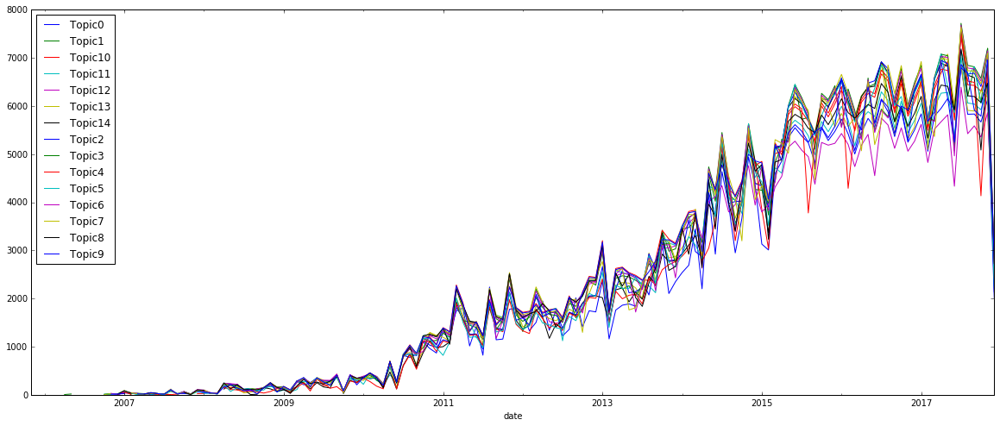

In [142]:
topic_count_df.plot()

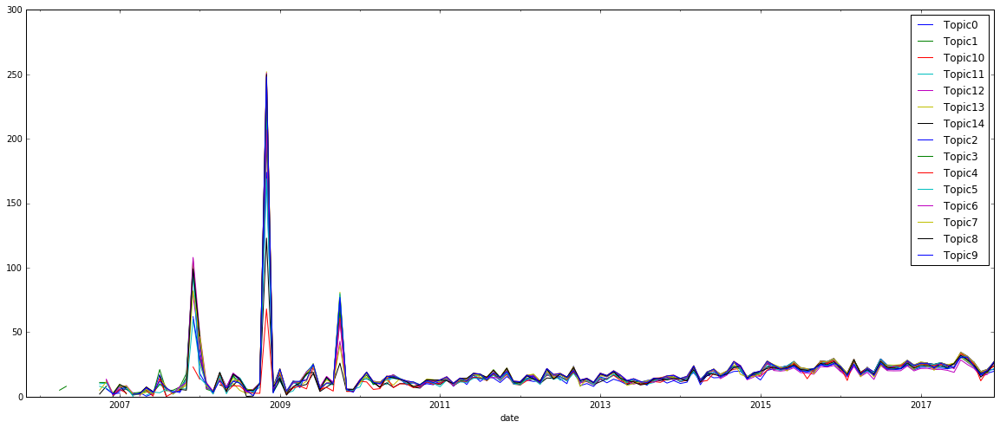

In [143]:
#Standardize over number of reviews
#topic_count_no_reviews = 
SB_count = SB_monthly.apply(len)
#type(MAG_count)
topic_count_df.divide(SB_count, axis='index').plot()

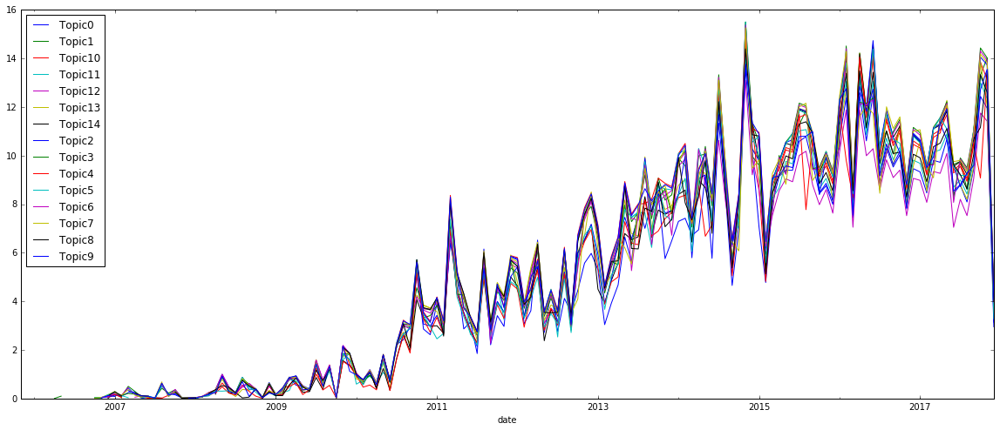

In [144]:
#Standardize over average length of reviews
#topic_count_no_reviews = 
SB_average = SB_monthly.apply(rev_len)
#type(MAG_count)
topic_count_df.divide(SB_average, axis='index').plot()

In [145]:
# LDA can only use raw term counts for LDA because it is a probabilistic graphical model
tf_vectorizer1 = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tf1 = tf_vectorizer1.fit_transform(doc_lst)
tf_feature_names2 = tf_vectorizer1.get_feature_names()
lda_model = LatentDirichletAllocation(n_components=no_topics, max_iter=5, learning_method='online', learning_offset=50.,
                                random_state=0).fit(tf1)
lda_W = lda_model.transform(tf1)
lda_H = lda_model.components_

In [146]:
topics_lda = get_topics(lda_H, lda_W, tf_feature_names2, no_top_words)

In [147]:
topics_lda

{'Topic0': ['line',
  'long',
  'wait',
  'morning',
  'waiting',
  '10',
  'minutes',
  'say',
  'drive',
  'just',
  'times',
  'early',
  'way',
  'mins',
  'cars'],
 'Topic1': ['tea',
  'store',
  'ice',
  'coffee',
  'water',
  'iced',
  'starbucks',
  'green',
  'new',
  'free',
  'employees',
  'hot',
  'rude',
  'just',
  'lemonade'],
 'Topic10': ['starbucks',
  'mobile',
  'service',
  'drive',
  'friendly',
  'location',
  'fast',
  'baristas',
  'order',
  'busy',
  'staff',
  'employees',
  'orders',
  've',
  'efficient'],
 'Topic11': ['know',
  'guy',
  'barista',
  'horrible',
  'came',
  'actually',
  'run',
  'polite',
  'receipt',
  'team',
  'trying',
  'weren',
  'moved',
  'left',
  'turn'],
 'Topic12': ['coffee',
  'cup',
  'work',
  'come',
  'morning',
  'latte',
  'espresso',
  'half',
  'doesn',
  'just',
  'pumpkin',
  'way',
  'caffeine',
  'place',
  'fix'],
 'Topic13': ['drink',
  'order',
  'ordered',
  'time',
  'minutes',
  'asked',
  'said',
  'drinks'

In [148]:
def my_lda_count(text):
    topic_count_dict = dict()
    counter_dict = dict()
    v1 = 0
    tok_lst = []
    for s in text:
        
        d = nlp(s)
        for tok in d:
            if tok.is_stop == False and tok.is_alpha == True:
                tok_lst.append(tok.lemma_)
    counter_dict = dict(Counter(tok_lst))
    #topic_count_dict = {}
    
    for k,v in counter_dict.items():
        for k1 in topics.keys():
            if k in topics_lda[k1]:
                v1 += v
                topic_count_dict[k1] = v1
    return(pd.Series(topic_count_dict))

In [150]:
lda_count_df = SB_monthly.apply(my_lda_count)
lda_count_df.head()

,Topic0,Topic1,Topic10,Topic11,Topic12,Topic13,Topic14,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9
date,,,,,,,,,,,,,,,
2005-11-30,NaN,6.0,NaN,NaN,11.0,NaN,10.0,NaN,1.0,8.0,7.0,9.0,NaN,2.0,3.0
2005-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-31,79.0,48.0,58.0,NaN,17.0,32.0,73.0,78.0,30.0,63.0,53.0,68.0,NaN,NaN,34.0
2006-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


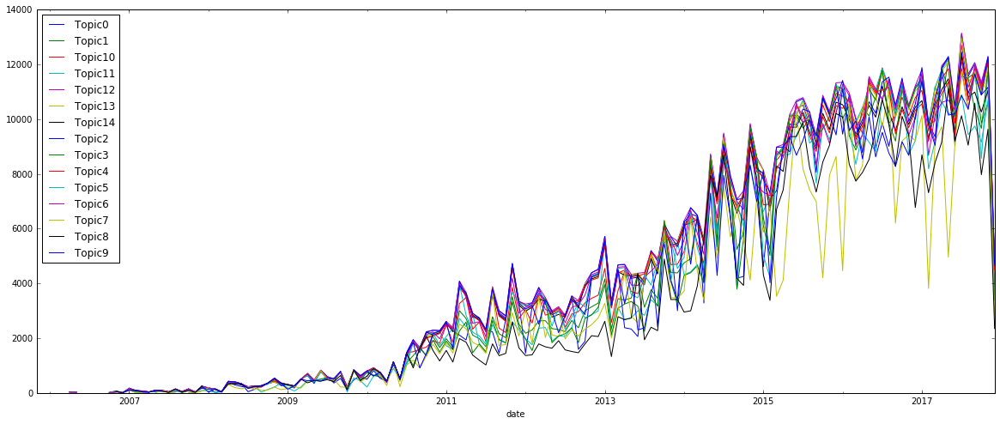

In [151]:
lda_count_df.plot()

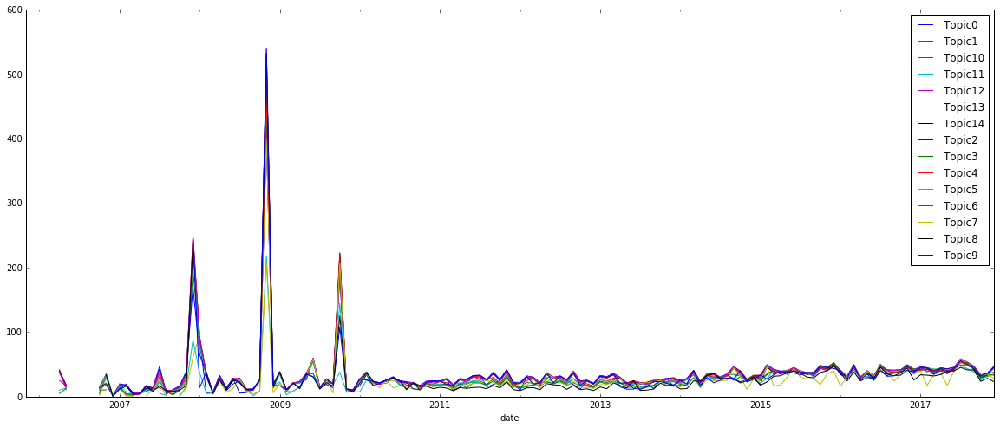

In [152]:
lda_count_df.divide(SB_count, axis='index').plot()

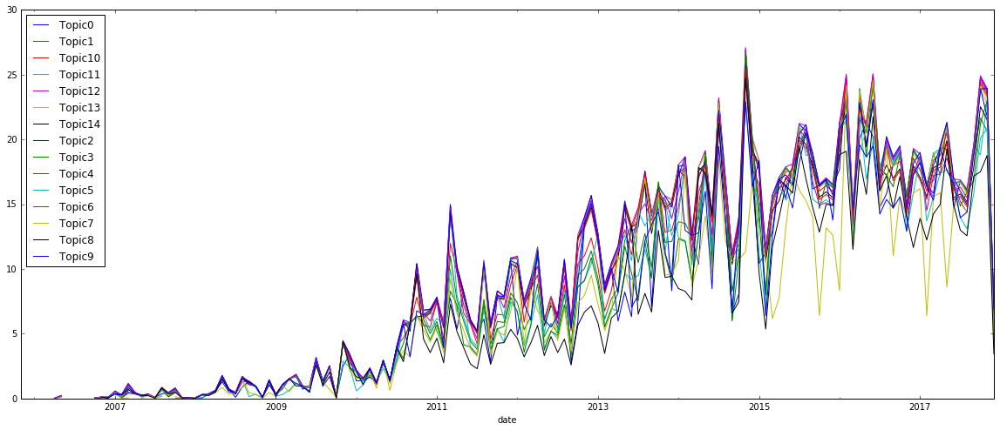

In [153]:
lda_count_df.divide(SB_average, axis='index').plot()

Similar pattern is shown here (LDA vs. NMF). Now let us look at the average star levels across time.

# Stars

In [154]:
SB_star = SB_df['stars']
SB_star.head()

date
2005-11-30    4
2006-01-06    4
2006-01-14    3
2006-01-18    2
2006-04-04    3
Name: stars, dtype: int64

In [155]:
SB_stars_monthly = SB_star.resample('M').mean()
SB_stars_monthly.dropna(inplace=True)
#MAG_reviews_weekly['text'].str.split(' ')
SB_stars_monthly.head()

date
2005-11-30    4.0
2006-01-31    3.0
2006-04-30    2.6
2006-05-31    3.0
2006-08-31    4.0
Name: stars, dtype: float64

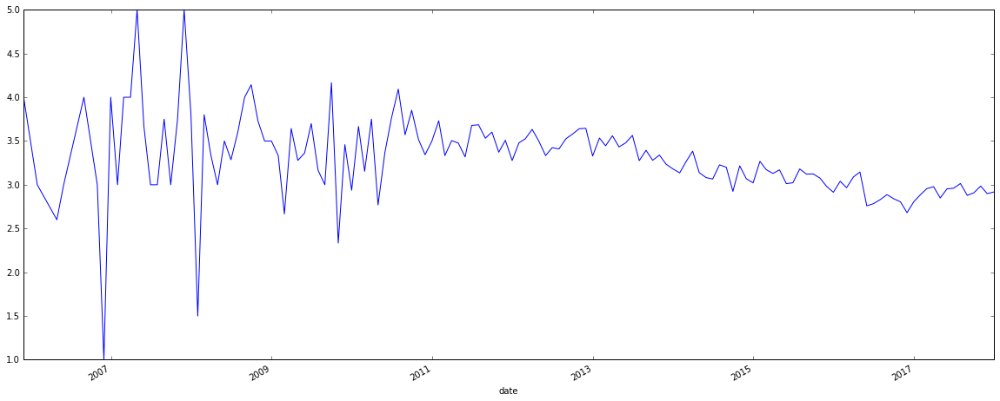

In [156]:
SB_stars_monthly.plot()


# Useful, Funny, Cool

In [157]:
SB_metrics = SB_df[['useful', 'funny', 'cool']]
SB_metrics.head()

,useful,funny,cool
date,,,
2005-11-30,0,0,0
2006-01-06,0,1,0
2006-01-14,0,0,0
2006-01-18,0,0,0
2006-04-04,0,0,0


In [158]:
SB_metrics_monthly = SB_metrics.resample('M').mean()
SB_metrics_monthly.dropna(inplace=True)
#MAG_reviews_weekly['text'].str.split(' ')
SB_metrics_monthly.head()

,useful,funny,cool
date,,,
2005-11-30,0.0,0.000000,0.0
2006-01-31,0.0,0.333333,0.0
2006-04-30,0.0,0.000000,0.0
2006-05-31,0.0,0.000000,1.0
2006-08-31,0.0,0.000000,0.0


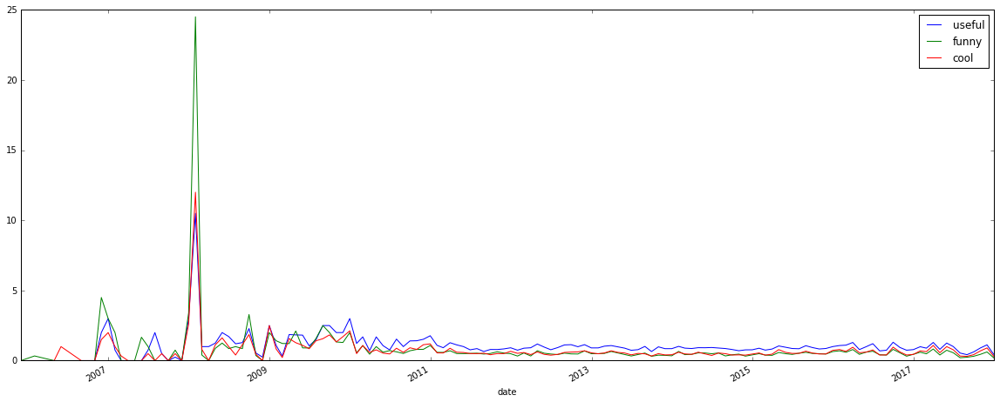

In [159]:
SB_metrics_monthly.plot()

So much for topic analysis, now we move on to sentiment analysis.

Firstly, we are going to use Textblob.

In [161]:
SB_monthly.ix['2011-05-31']

['Probably the worst Starbucks I\'ve ever experienced.\n\nThese employees were clearly airport employees, not trained in the Starbucks program. They were inefficient, slow, rude, and they didn\'t make my drink right. Additionally, airport prices are exorbitant - $10 for a latte and a bottle of water. \n\nI want my coffee. I don\'t want to wait 20 minutes in a 3-person line for a drink that isn\'t even made correctly.Been there a few times in the morning and afternoon. Good place to sit with a coffee or iced tea and work or job search with your laptop, with nobody bothering you. Staff seems friendly. In other words, it\'s a Starbucks.Yup, I\'m gonna review a Starbucks in an airport.... \n\nI think I always grab a coffee here, with each flight. The staff is friendly. \n\nAs MarNae B said, it\'s a "lil pricier". A tall cup of drip coffee is $2.07 with tax. \n\nYou can use your Starbucks cards here, but you can\'t reload.One of the smallest Starbucks I\'ve ever seen. There\'s actually more

In [162]:
polarity_scores = []
for s in SB_monthly.ix['2011-05-31']:
    testmonial = tb.TextBlob(s)
    #print(type(testmonial.sentiment.polarity))
    polarity_scores.append(testmonial.sentiment.polarity)
print(sum(polarity_scores)/len(polarity_scores))

0.14607350031740762


In [163]:
def blob_senti(text):
    pol_scores = []
    mean_score = 0
    for s in text:
        tm = tb.TextBlob(s)
        pol_scores.append(tm.sentiment.polarity)
    if(len(pol_scores)>0):
        mean_score = sum(pol_scores)/len(pol_scores)
    else:
        mean_score = np.nan
    return(mean_score)

In [164]:
SB_senti_blob = SB_monthly.apply(blob_senti)

In [165]:
SB_senti_blob.head()

date
2005-11-30    0.375000
2005-12-31         NaN
2006-01-31    0.004278
2006-02-28         NaN
2006-03-31         NaN
Freq: M, Name: text, dtype: float64

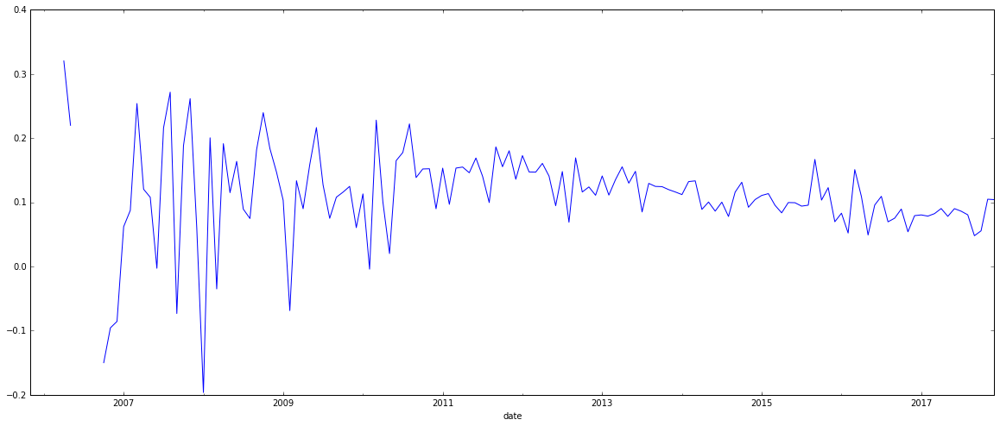

In [166]:
SB_senti_blob.plot()

In [168]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [169]:
sid = SentimentIntensityAnalyzer()
pol_scores_vader = []

for s in SB_monthly.ix['2011-05-31']:
    ss = sid.polarity_scores(s)
    compound_score = ss['compound']
    pol_scores_vader.append(compound_score)

print(sum(pol_scores_vader) / len(pol_scores_vader))

0.3242944444444445


In [170]:
def vader_senti(text):
    sid = SentimentIntensityAnalyzer()
    pol_scores_vader = []
    mean_score = 0
    for s in text:
        ss = sid.polarity_scores(s)
        compound_score = ss['compound']
        pol_scores_vader.append(compound_score)
    if(len(pol_scores_vader)>0):
        mean_score = sum(pol_scores_vader) / len(pol_scores_vader)
    else:
        mean_score = np.nan
    return(mean_score)

In [172]:
SB_senti_vader = SB_monthly.apply(vader_senti)

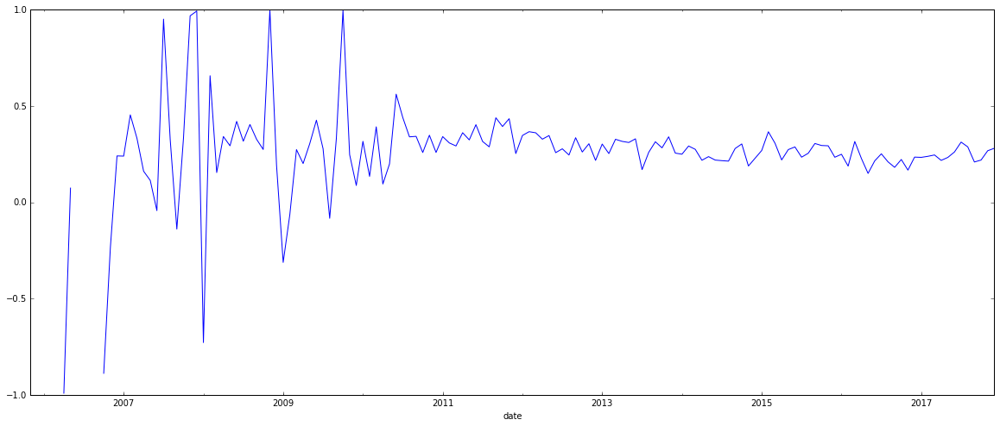

In [173]:
SB_senti_vader.plot()